# Problem

## Bank Transaction Fraud Detection

### Anomaly Detection Task

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib as plt 
import matplotlib.pyplot as plt 
import seaborn as sns

np.random.seed(42)

# Get the Data

In [2]:
# downloaded from kaggle

## Take a Quick Look at Data

In [3]:
df = pd.read_csv("bank_transactions_data_2.csv")

In [4]:
df.shape

(2512, 16)

In [5]:
df.columns

Index(['TransactionID', 'AccountID', 'TransactionAmount', 'TransactionDate',
       'TransactionType', 'Location', 'DeviceID', 'IP Address', 'MerchantID',
       'Channel', 'CustomerAge', 'CustomerOccupation', 'TransactionDuration',
       'LoginAttempts', 'AccountBalance', 'PreviousTransactionDate'],
      dtype='object')

### Attributes
TransactionID: Unique alphanumeric identifier for each transaction

AccountID: Unique identifier for each account, with multiple transactions per account

TransactionAmount: Monetary value of each transaction, ranging from small everyday expenses to larger purchases

TransactionDate: Timestamp of each transaction, capturing date and time

TransactionType: Categorical field indicating 'Credit' or 'Debit' transactions

Location: Geographic location of the transaction, represented by U.S. city names

DeviceID: Alphanumeric identifier for devices used to perform the transaction

IP Address: IPv4 address associated with the transaction, with occasional changes for some accounts

MerchantID: Unique identifier for merchants, showing preferred and outlier merchants for each account

AccountBalance: Balance in the account post-transaction, with logical correlations based on transaction type and amount

PreviousTransactionDate: Timestamp of the last transaction for the account, aiding in calculating transaction frequency

Channel: Channel through which the transaction was performed (e.g., Online, ATM, Branch)

CustomerAge: Age of the account holder, with logical groupings based on occupation

CustomerOccupation: Occupation of the account holder (e.g., Doctor, Engineer, Student, Retired), reflecting income patterns

TransactionDuration: Duration of the transaction in seconds, varying by transaction type

LoginAttempts: Number of login attempts before the transaction, with higher values indicating potential anomalies


In [6]:
df.head()

,TransactionID,AccountID,TransactionAmount,TransactionDate,TransactionType,Location,DeviceID,IP Address,MerchantID,Channel,CustomerAge,CustomerOccupation,TransactionDuration,LoginAttempts,AccountBalance,PreviousTransactionDate
0,TX000001,AC00128,14.09,2023-04-11 16:29:14,Debit,San Diego,D000380,162.198.218.92,M015,ATM,70,Doctor,81,1,5112.21,2024-11-04 08:08:08
1,TX000002,AC00455,376.24,2023-06-27 16:44:19,Debit,Houston,D000051,13.149.61.4,M052,ATM,68,Doctor,141,1,13758.91,2024-11-04 08:09:35
2,TX000003,AC00019,126.29,2023-07-10 18:16:08,Debit,Mesa,D000235,215.97.143.157,M009,Online,19,Student,56,1,1122.35,2024-11-04 08:07:04
3,TX000004,AC00070,184.50,2023-05-05 16:32:11,Debit,Raleigh,D000187,200.13.225.150,M002,Online,26,Student,25,1,8569.06,2024-11-04 08:09:06
4,TX000005,AC00411,13.45,2023-10-16 17:51:24,Credit,Atlanta,D000308,65.164.3.100,M091,Online,26,Student,198,1,7429.40,2024-11-04 08:06:39


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2512 entries, 0 to 2511
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   TransactionID            2512 non-null   object 
 1   AccountID                2512 non-null   object 
 2   TransactionAmount        2512 non-null   float64
 3   TransactionDate          2512 non-null   object 
 4   TransactionType          2512 non-null   object 
 5   Location                 2512 non-null   object 
 6   DeviceID                 2512 non-null   object 
 7   IP Address               2512 non-null   object 
 8   MerchantID               2512 non-null   object 
 9   Channel                  2512 non-null   object 
 10  CustomerAge              2512 non-null   int64  
 11  CustomerOccupation       2512 non-null   object 
 12  TransactionDuration      2512 non-null   int64  
 13  LoginAttempts            2512 non-null   int64  
 14  AccountBalance          

In [8]:
# check for missing values
df.isnull().sum()

TransactionID              0
AccountID                  0
TransactionAmount          0
TransactionDate            0
TransactionType            0
Location                   0
DeviceID                   0
IP Address                 0
MerchantID                 0
Channel                    0
CustomerAge                0
CustomerOccupation         0
TransactionDuration        0
LoginAttempts              0
AccountBalance             0
PreviousTransactionDate    0
dtype: int64

In [9]:
# check for duplicates
df.duplicated().sum()

0

In [10]:
df.describe()

,TransactionAmount,CustomerAge,TransactionDuration,LoginAttempts,AccountBalance
count,2512.000000,2512.000000,2512.000000,2512.000000,2512.000000
mean,297.593778,44.673965,119.643312,1.124602,5114.302966
std,291.946243,17.792198,69.963757,0.602662,3900.942499
min,0.260000,18.000000,10.000000,1.000000,101.250000
25%,81.885000,27.000000,63.000000,1.000000,1504.370000
50%,211.140000,45.000000,112.500000,1.000000,4735.510000
75%,414.527500,59.000000,161.000000,1.000000,7678.820000
max,1919.110000,80.000000,300.000000,5.000000,14977.990000


# Discovering & Visualizing Data

## Visualize Data

### Univariate Analysis

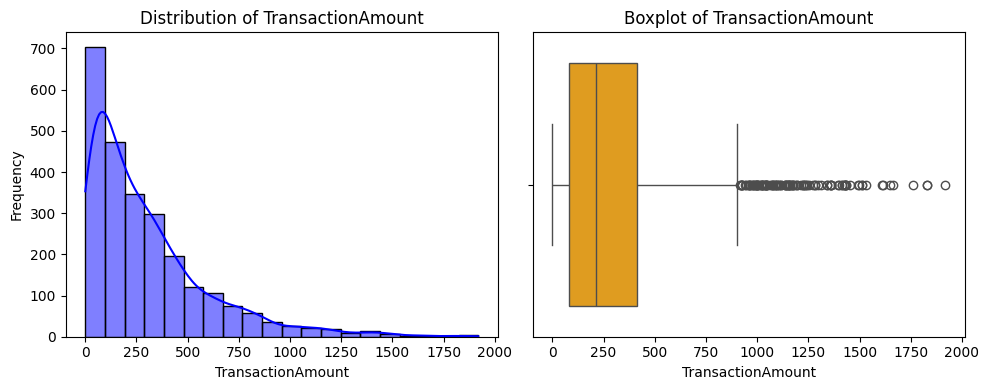

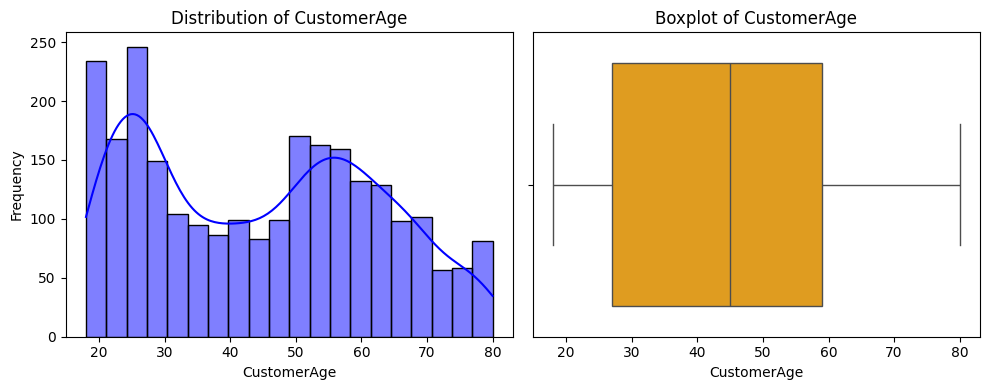

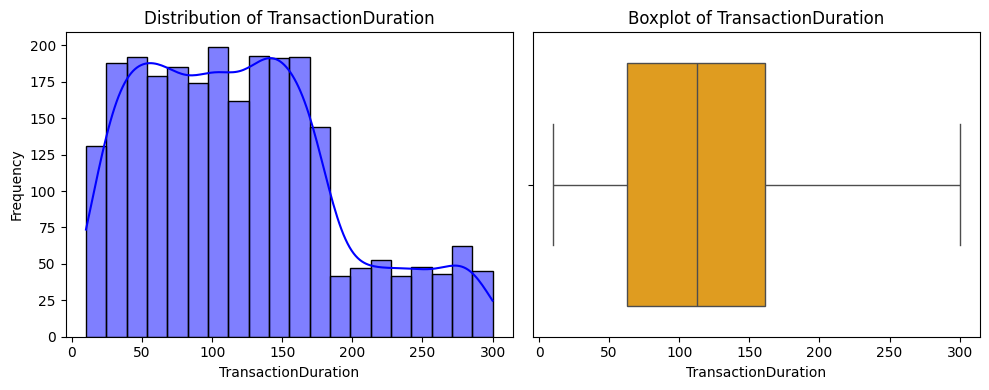

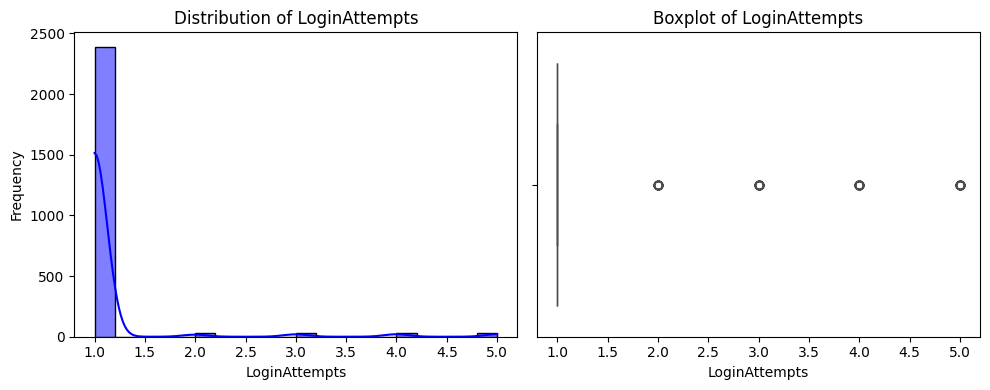

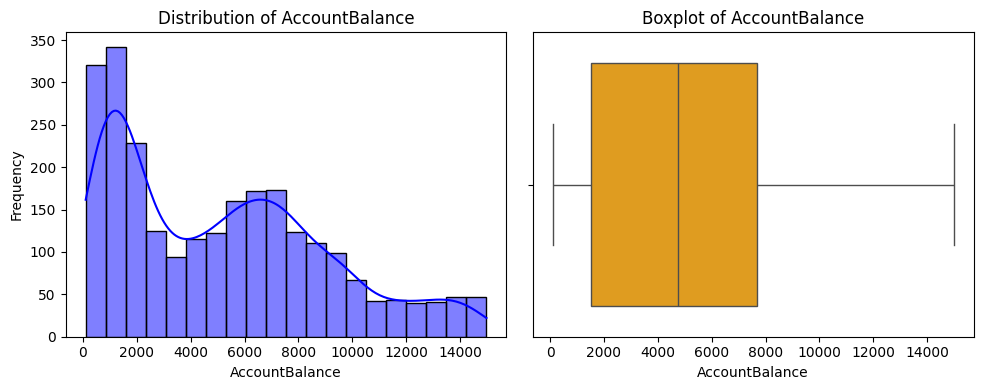

In [ ]:
# Identify numeric
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns

# Visualizing Numeric Columns
for col in numeric_cols:
    plt.figure(figsize=(10, 4))

    # Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(df[col], kde=True, bins=20, color='blue', edgecolor='black')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

    # Boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df[col], color='orange')
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)

    plt.tight_layout()
    plt.show()


C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\452972308.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=df[col], order=df[col].value_counts().index, palette='coolwarm')


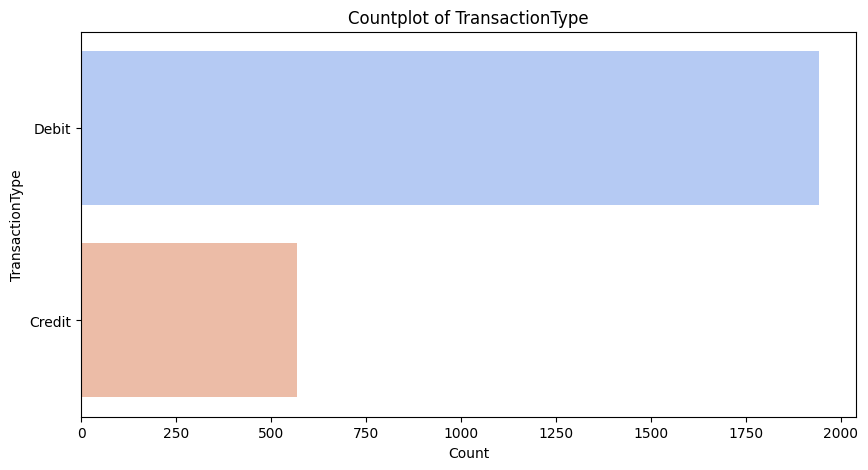

C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\452972308.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=df[col], order=df[col].value_counts().index, palette='coolwarm')


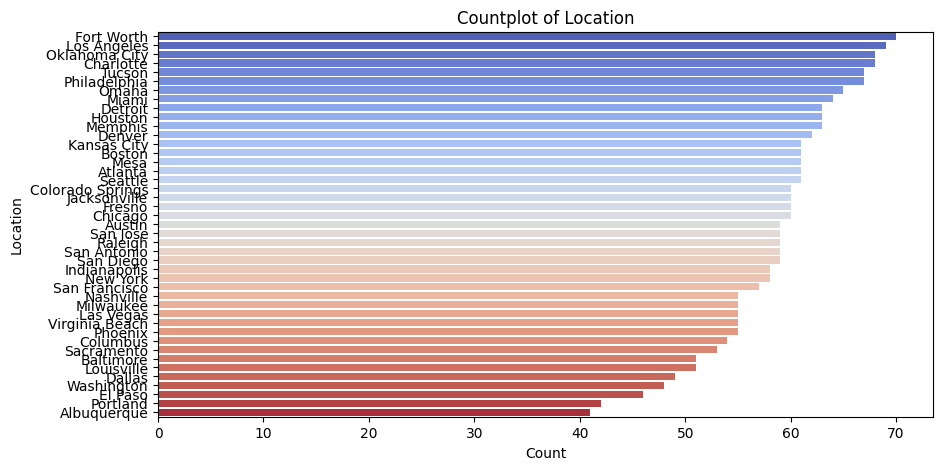

C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\452972308.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=df[col], order=df[col].value_counts().index, palette='coolwarm')


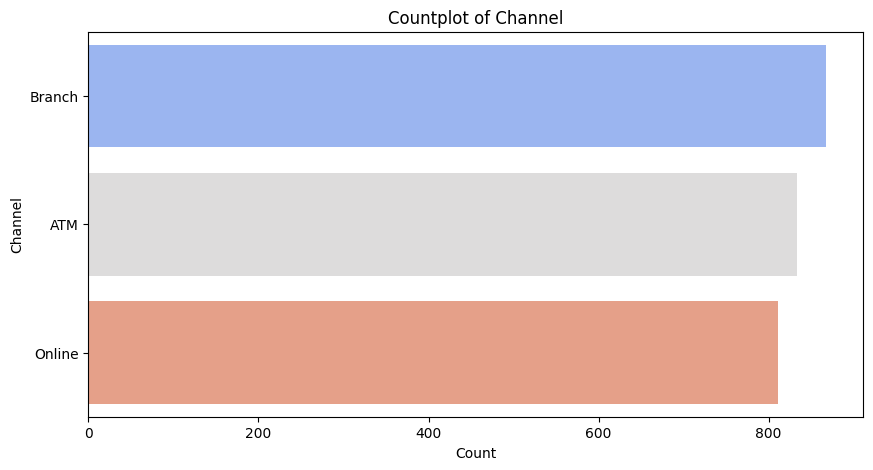

C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\452972308.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=df[col], order=df[col].value_counts().index, palette='coolwarm')


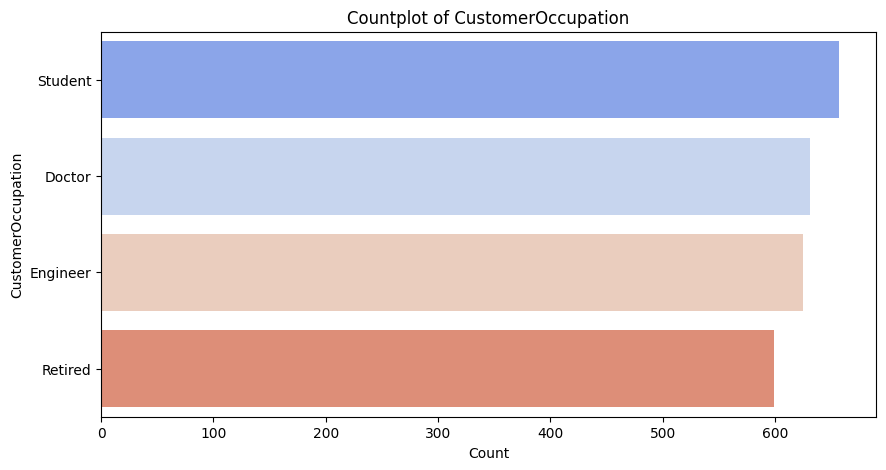

C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\452972308.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=df[col], order=df[col].value_counts().index, palette='coolwarm')


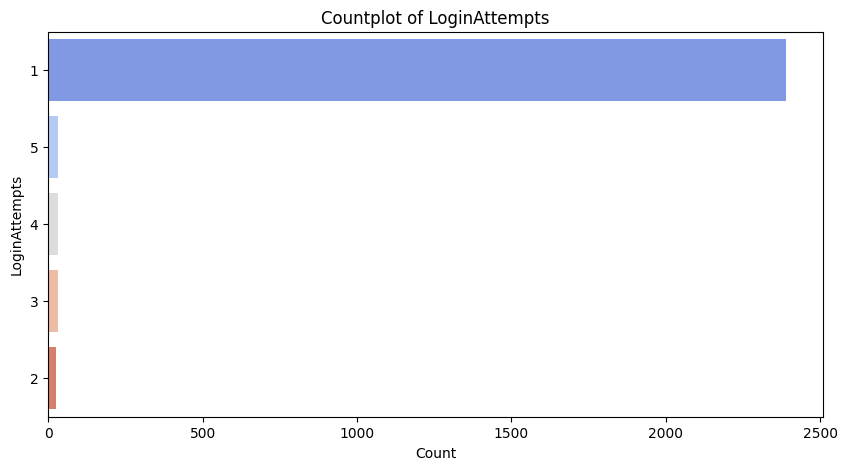

In [24]:
# Countplots for all possible attributes
for col in df.columns:
    if df[col].nunique() <= 50:  # Limit countplots to columns with fewer unique values
        plt.figure(figsize=(10, 5))
        sns.countplot(y=df[col], order=df[col].value_counts().index, palette='coolwarm')
        plt.title(f'Countplot of {col}')
        plt.xlabel('Count')
        plt.ylabel(col)
        plt.show()

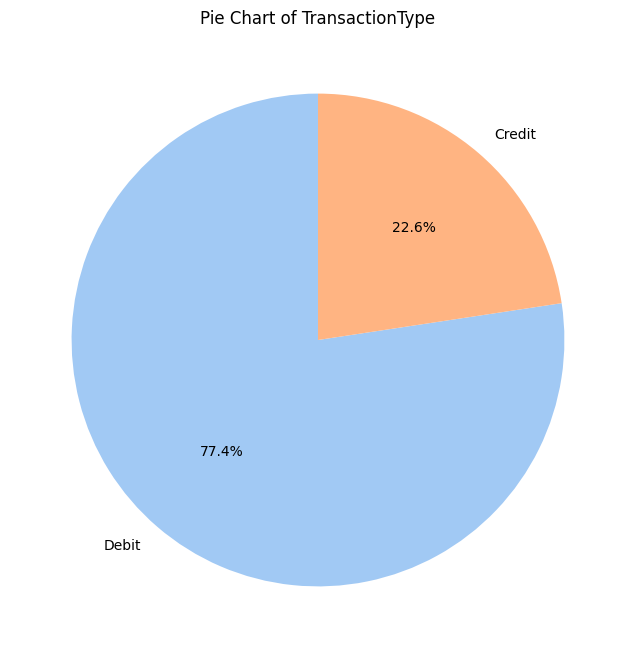

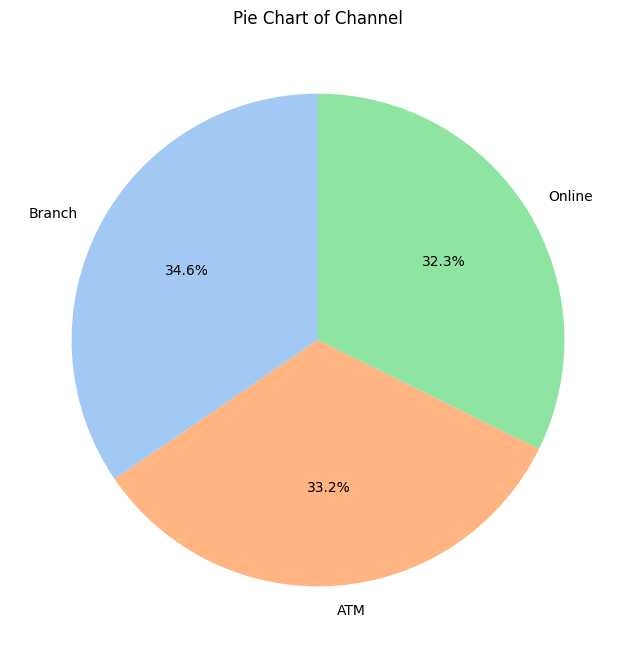

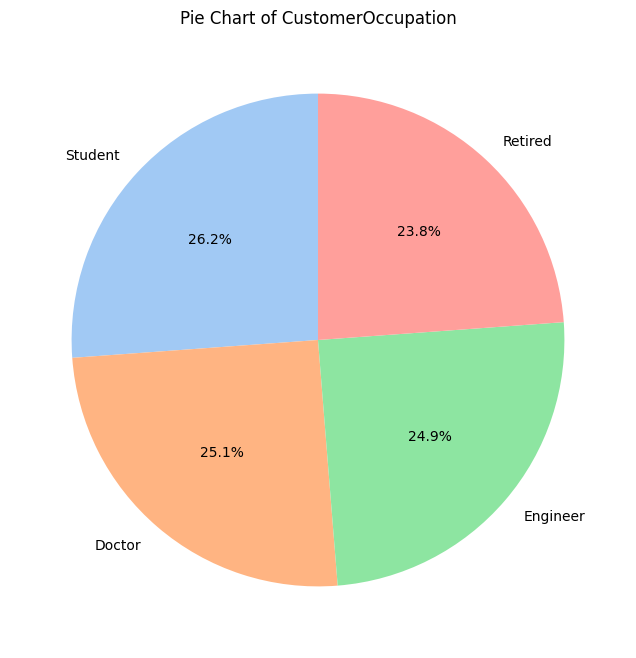

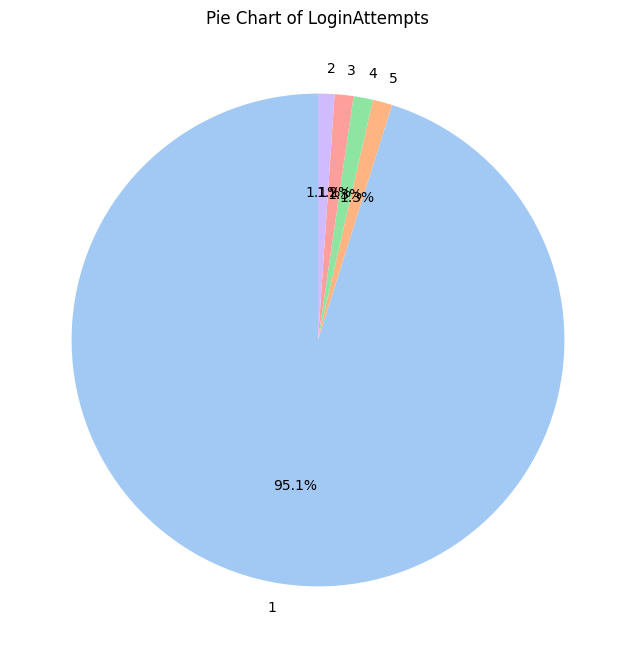

In [25]:
# Pie charts for all possible attributes
for col in df.columns:
    if df[col].nunique() <= 20:  # Limit pie charts to columns with fewer unique values
        plt.figure(figsize=(8, 8))
        df[col].value_counts().plot.pie(autopct='%1.1f%%', startangle=90, colors=sns.color_palette('pastel'))
        plt.title(f'Pie Chart of {col}')
        plt.ylabel('')
        plt.show()

C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\3223708115.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=df[df['MerchantID'].isin(top_20_merchants)]['MerchantID'], order=top_20_merchants, palette='cool')


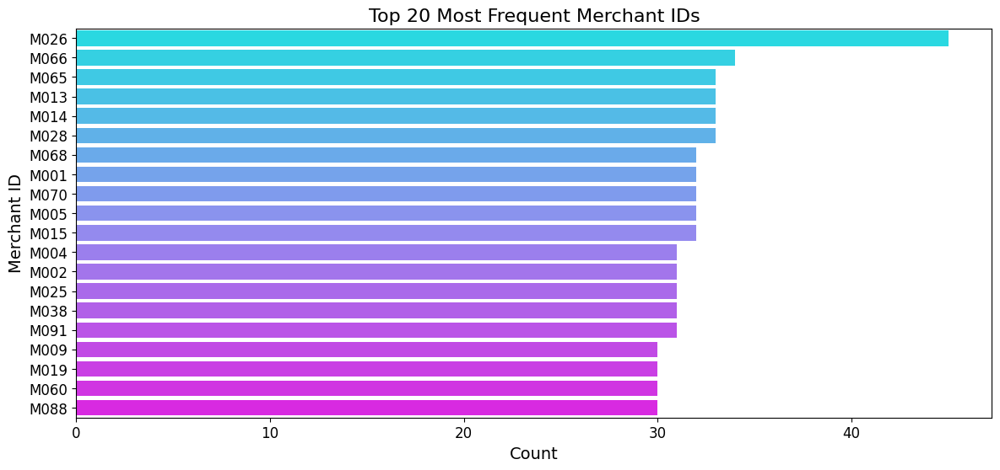

C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\3223708115.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(y=df[df['AccountID'].isin(top_20_accounts)]['AccountID'], order=top_20_accounts, palette='cool')


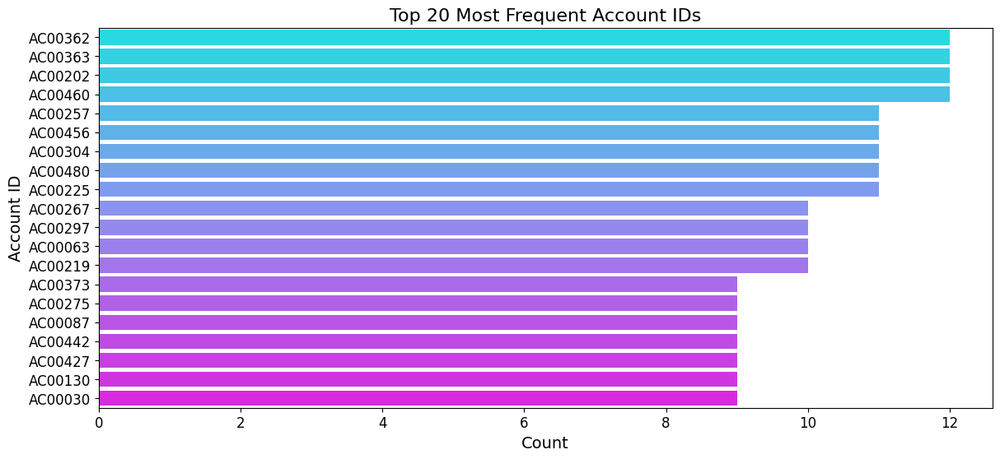

In [27]:
# Countplot for top 20 most frequent 'MerchantID'
top_20_merchants = df['MerchantID'].value_counts().head(20).index
plt.figure(figsize=(14, 6))
sns.countplot(y=df[df['MerchantID'].isin(top_20_merchants)]['MerchantID'], order=top_20_merchants, palette='cool')
plt.title('Top 20 Most Frequent Merchant IDs', fontsize=16)
plt.xlabel('Count', fontsize=14)
plt.ylabel('Merchant ID', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

# Countplot for top 20 most frequent 'AccountID'
top_20_accounts = df['AccountID'].value_counts().head(20).index
plt.figure(figsize=(14, 6))
sns.countplot(y=df[df['AccountID'].isin(top_20_accounts)]['AccountID'], order=top_20_accounts, palette='cool')
plt.title('Top 20 Most Frequent Account IDs', fontsize=16)
plt.xlabel('Count', fontsize=14)
plt.ylabel('Account ID', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

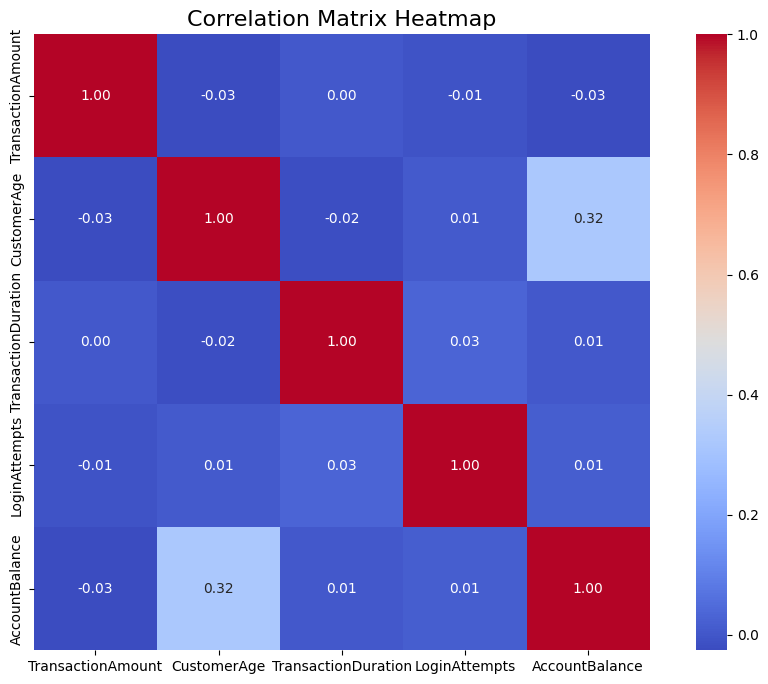

In [31]:
# Calculate correlation matrix
corr_matrix = df.corr(numeric_only=True)

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', cbar=True, square=True)
plt.title('Correlation Matrix Heatmap', fontsize=16)
plt.show()

### Bivariate Analysis

In [32]:
numeric_cols = ['TransactionAmount', 'CustomerAge', 'TransactionDuration', 'LoginAttempts', 'AccountBalance']
categorical_cols = ['TransactionType', 'Location', 'Channel', 'CustomerOccupation']

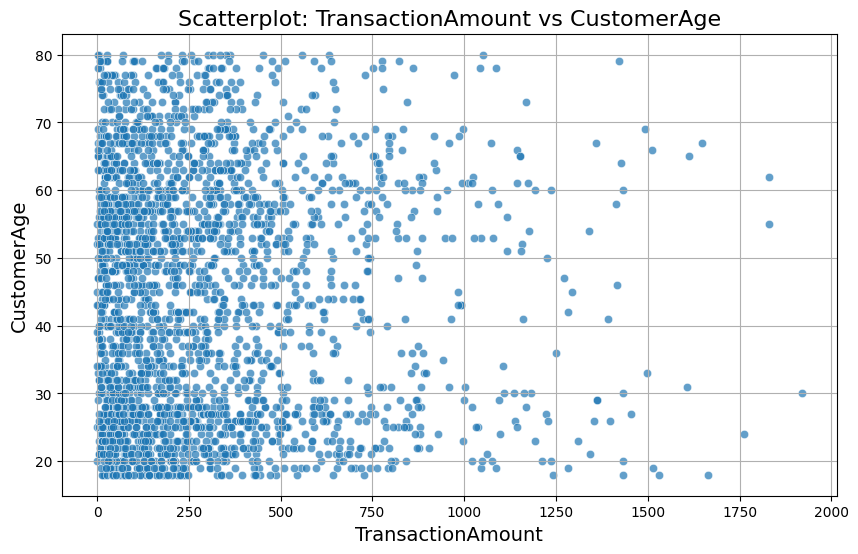

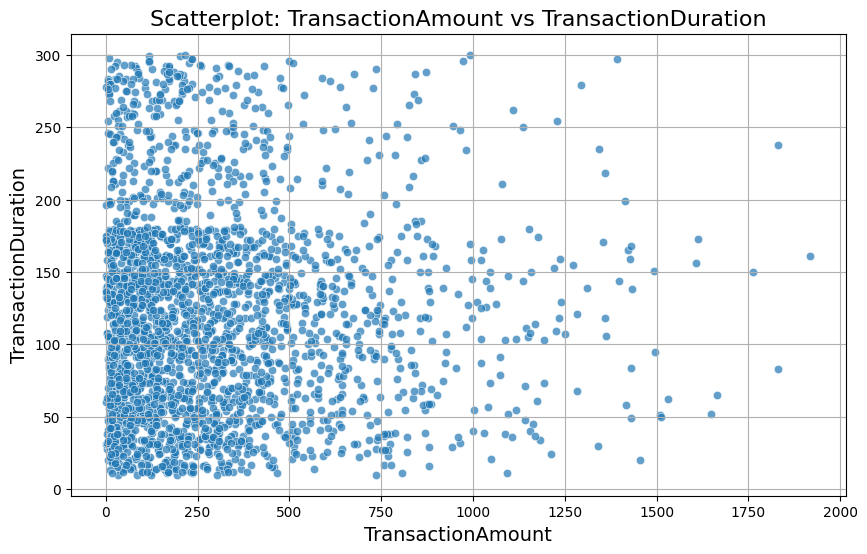

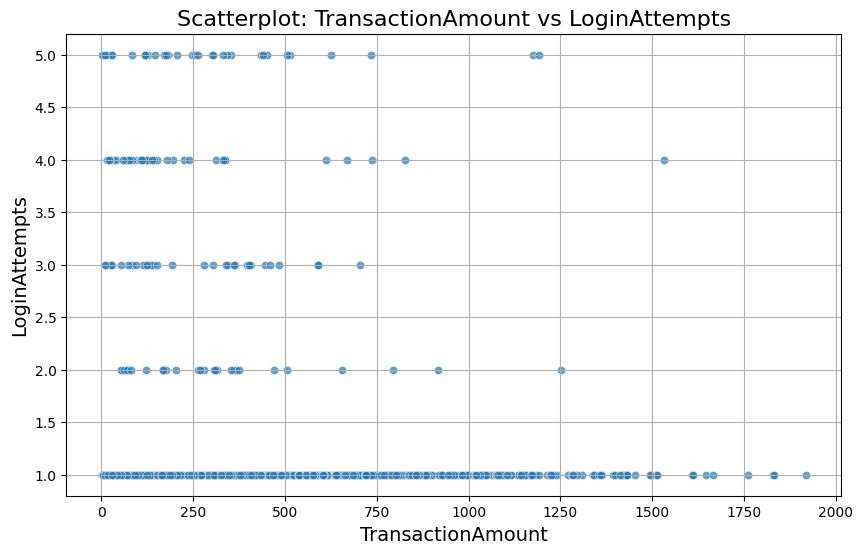

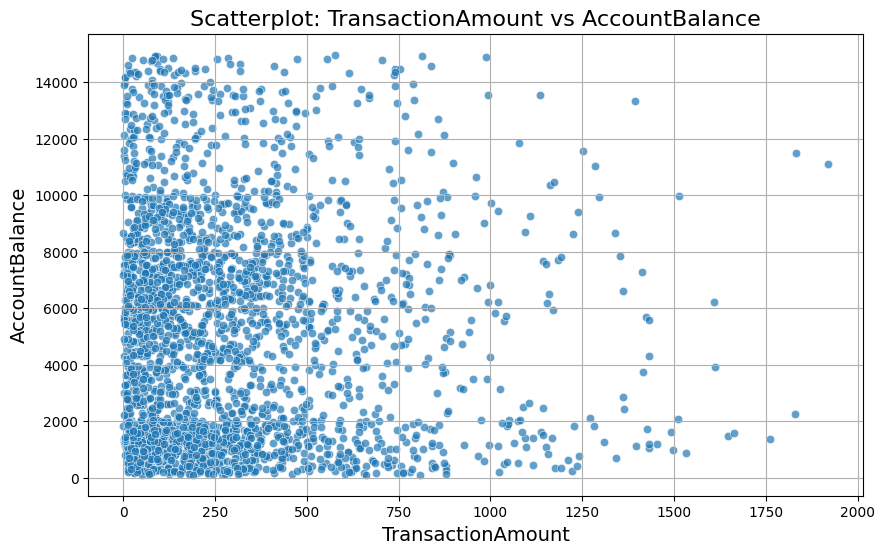

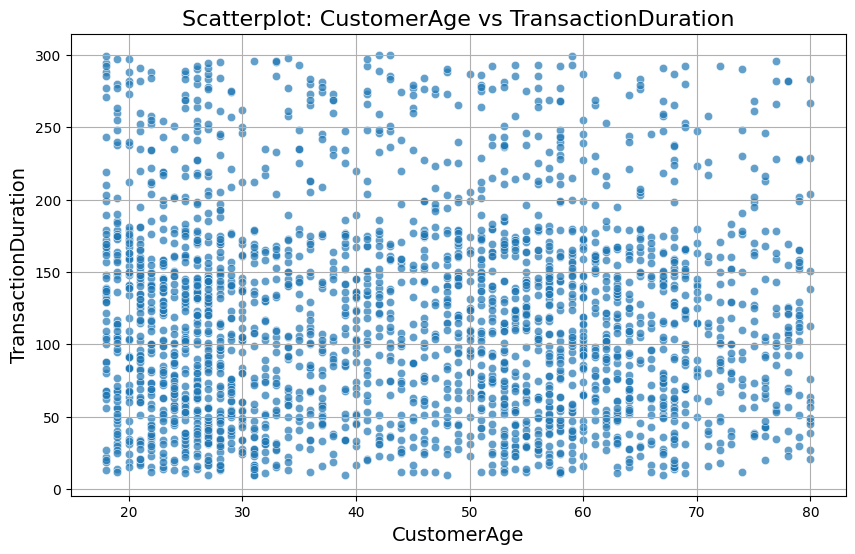

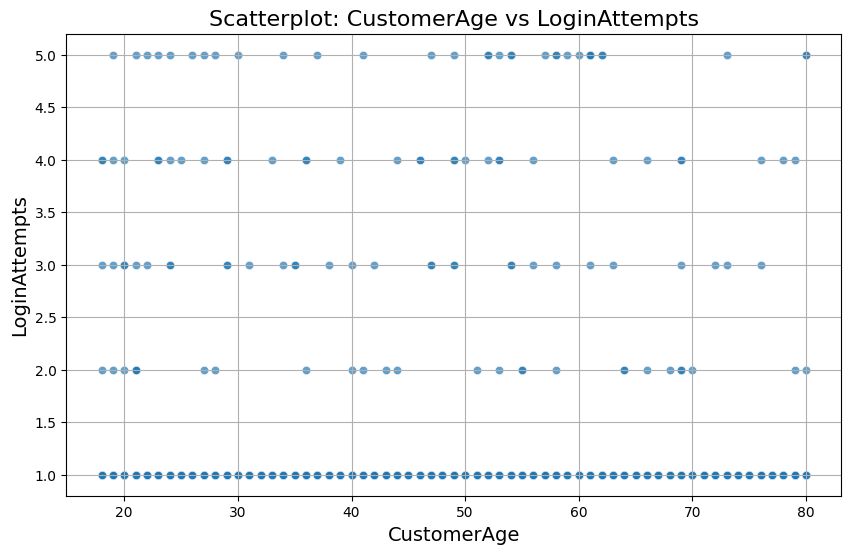

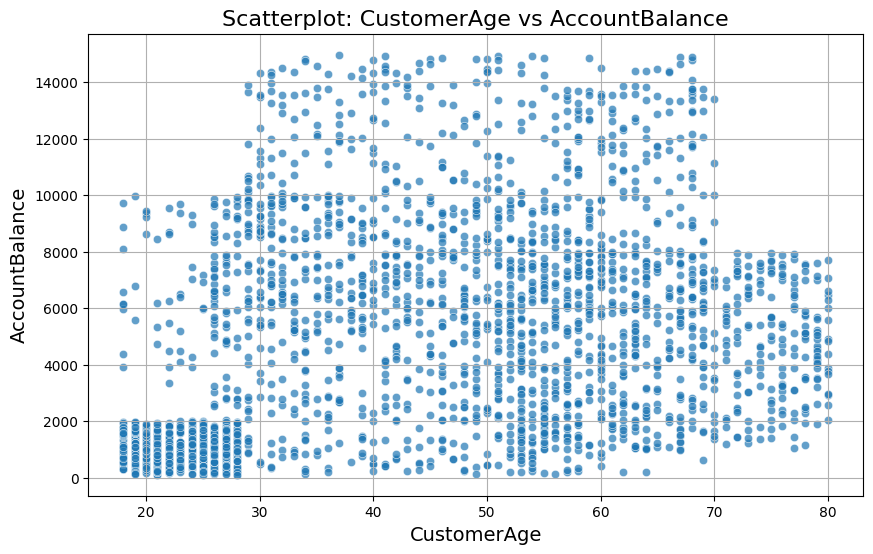

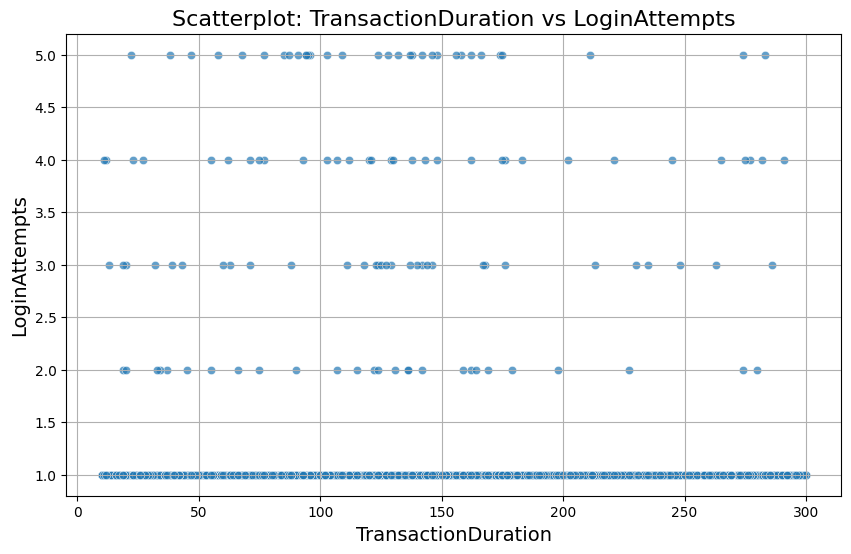

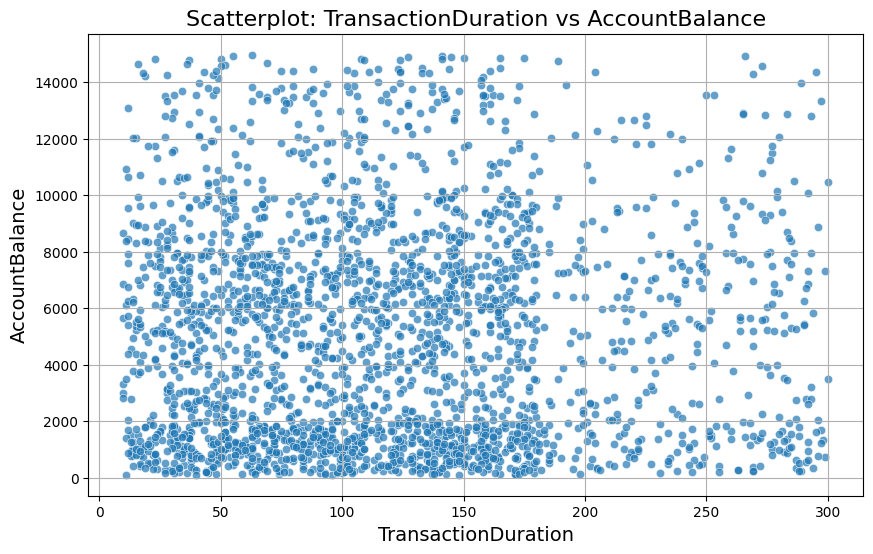

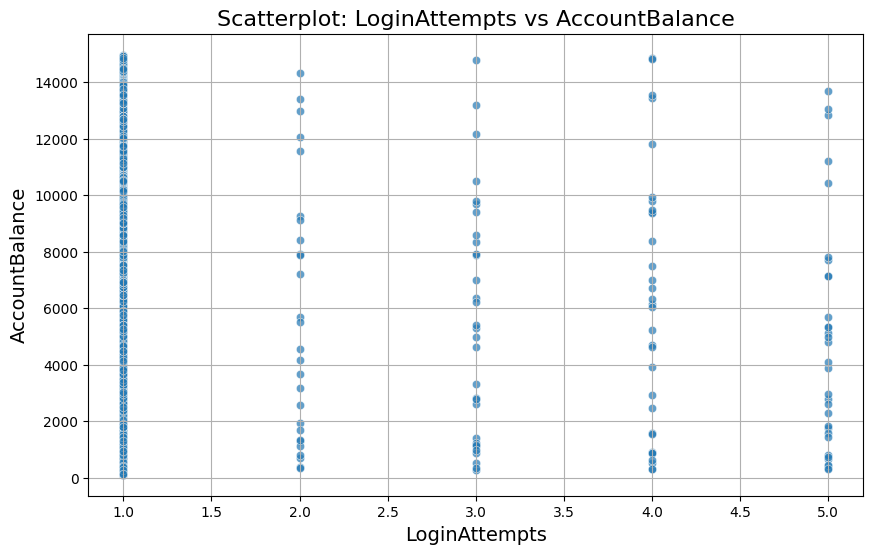

In [35]:
# Scatterplots for Numeric vs Numeric
for i, col1 in enumerate(numeric_cols):
    for col2 in numeric_cols[i+1:]:
        plt.figure(figsize=(10, 6))
        sns.scatterplot(x=df[col1], y=df[col2], alpha=0.7)
        plt.title(f'Scatterplot: {col1} vs {col2}', fontsize=16)
        plt.xlabel(col1, fontsize=14)
        plt.ylabel(col2, fontsize=14)
        plt.grid(True)
        plt.show()

C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\4166861010.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=df, palette='Set2')


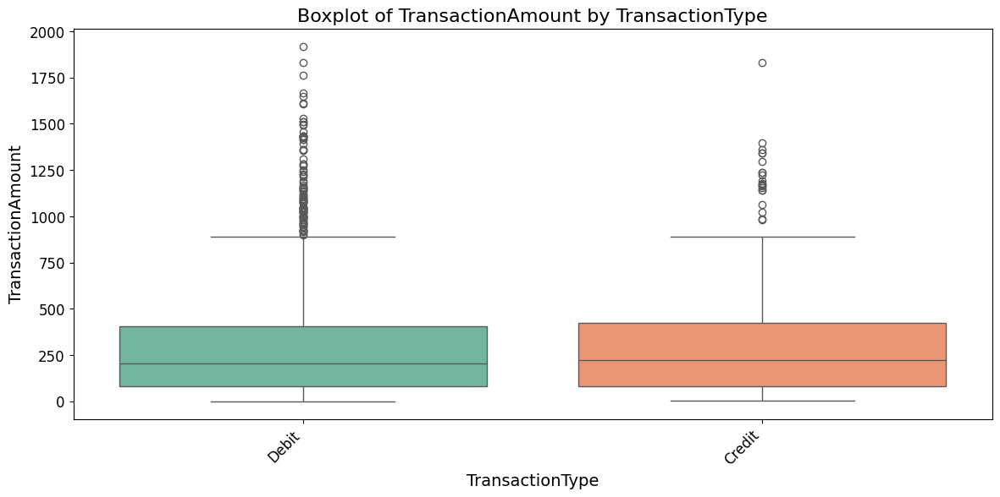

C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\4166861010.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=df, palette='Set2')


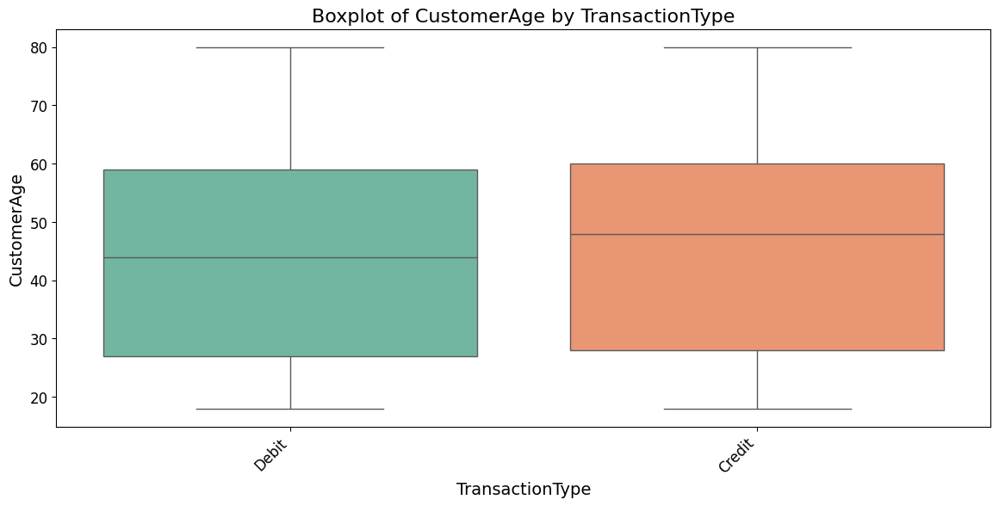

C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\4166861010.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=df, palette='Set2')


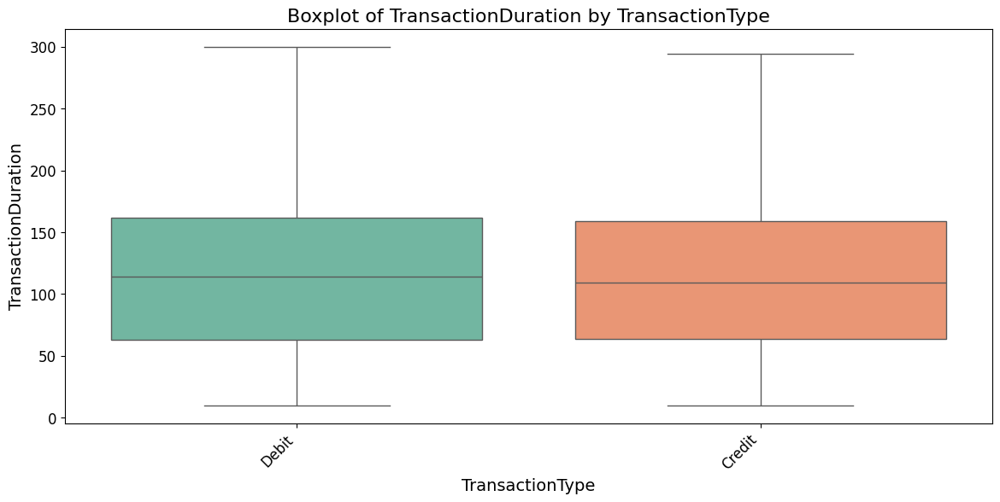

C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\4166861010.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=df, palette='Set2')


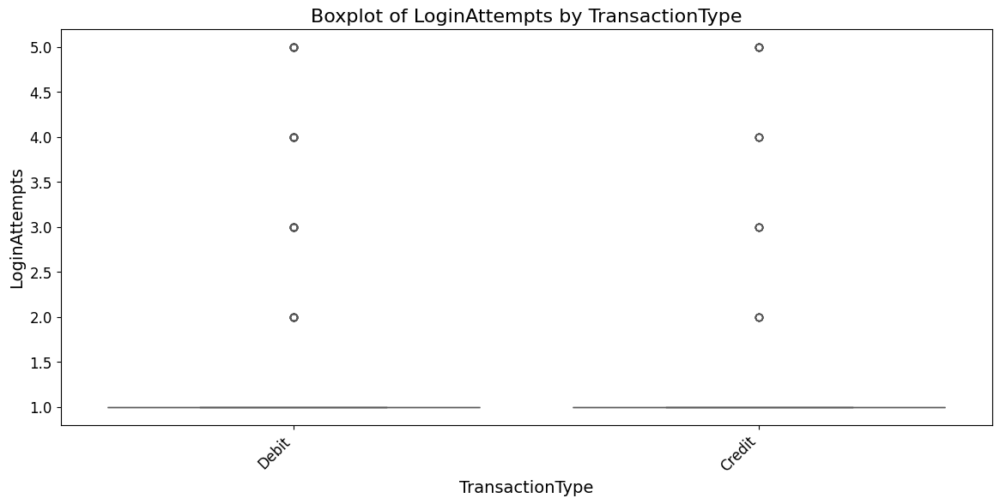

C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\4166861010.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=df, palette='Set2')


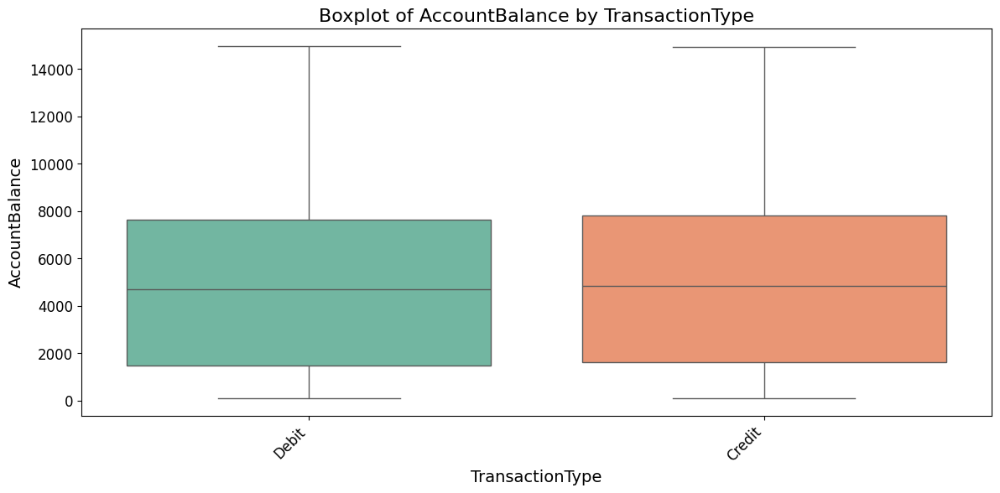

C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\4166861010.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=df, palette='Set2')


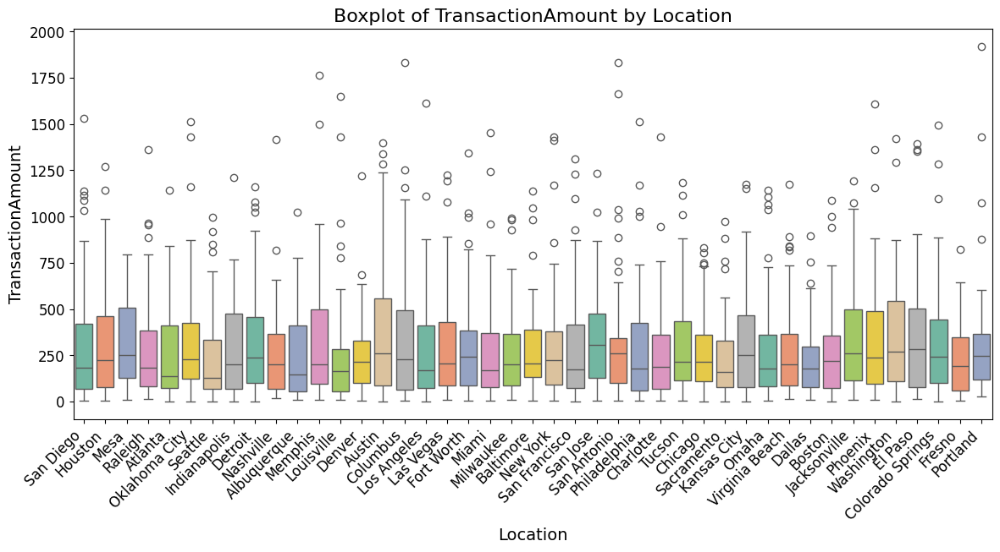

C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\4166861010.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=df, palette='Set2')


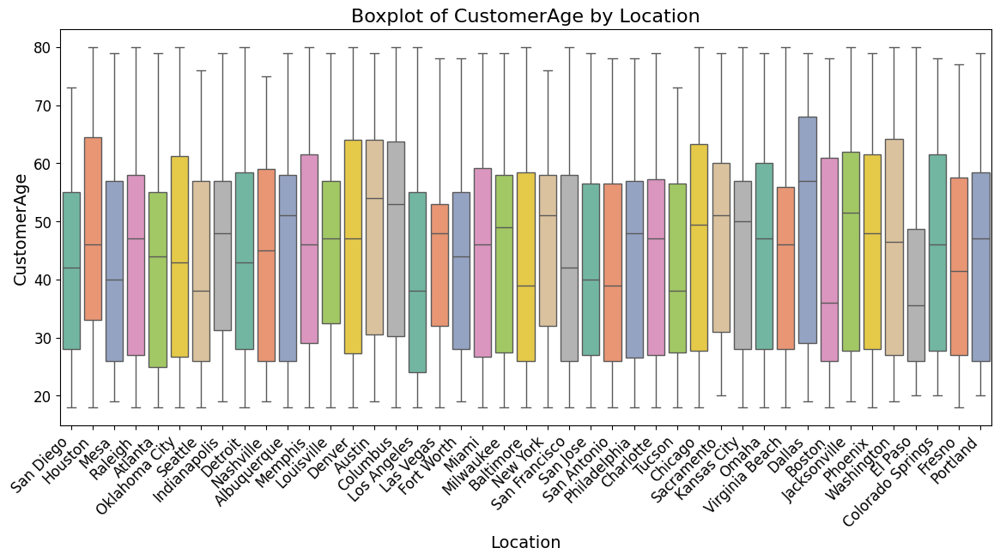

C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\4166861010.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=df, palette='Set2')


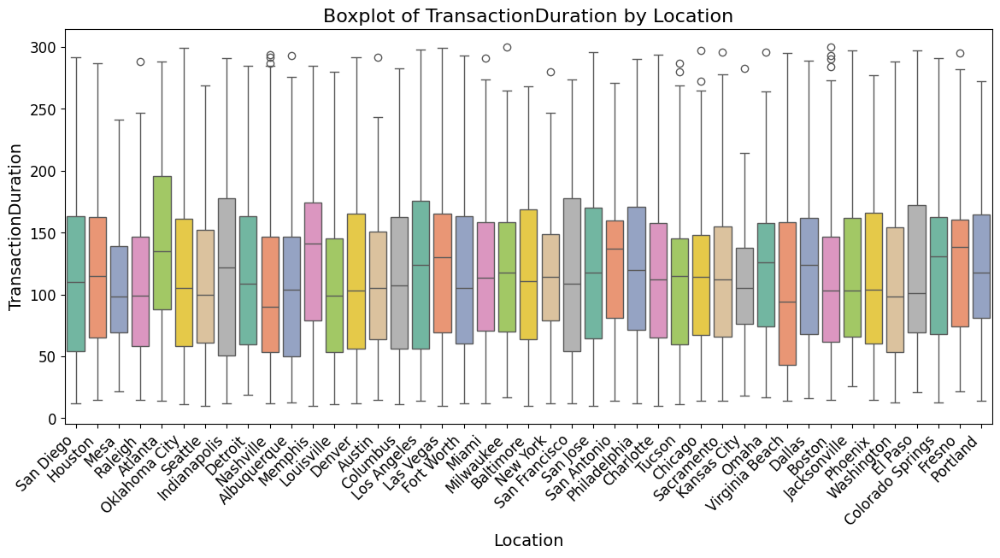

C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\4166861010.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=df, palette='Set2')


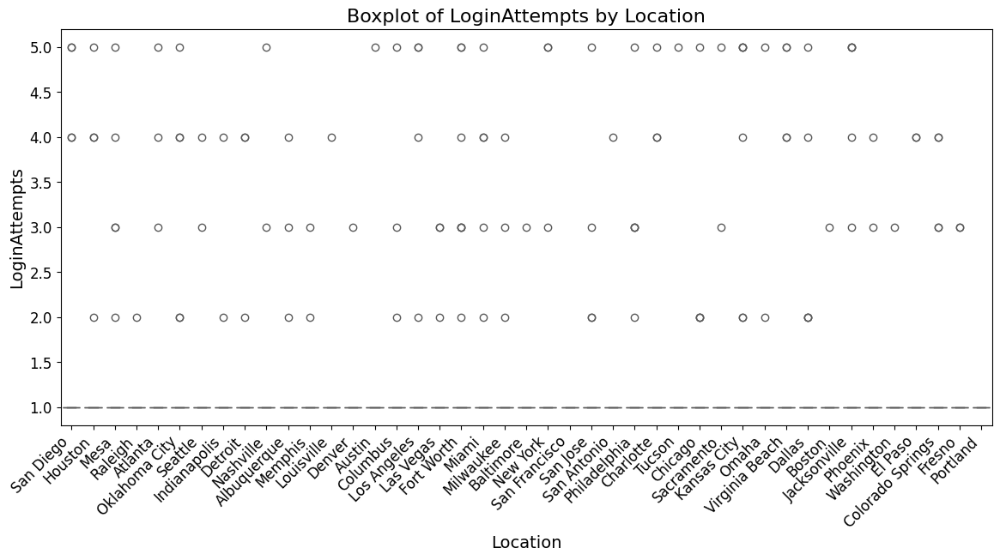

C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\4166861010.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=df, palette='Set2')


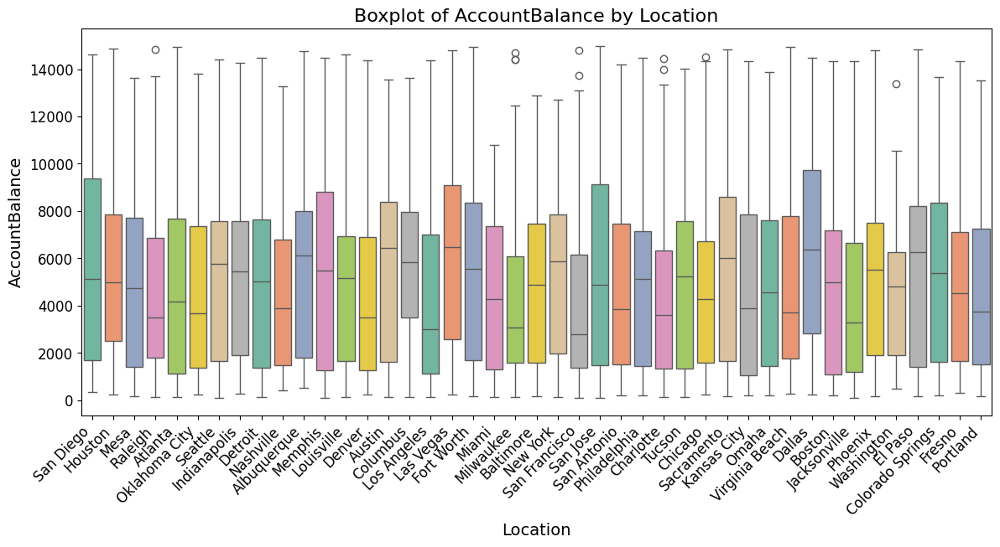

C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\4166861010.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=df, palette='Set2')


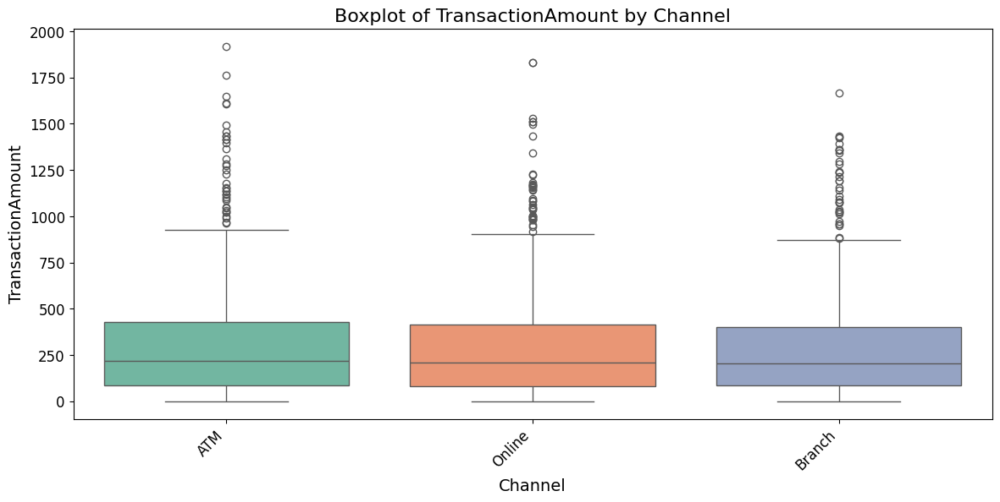

C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\4166861010.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=df, palette='Set2')


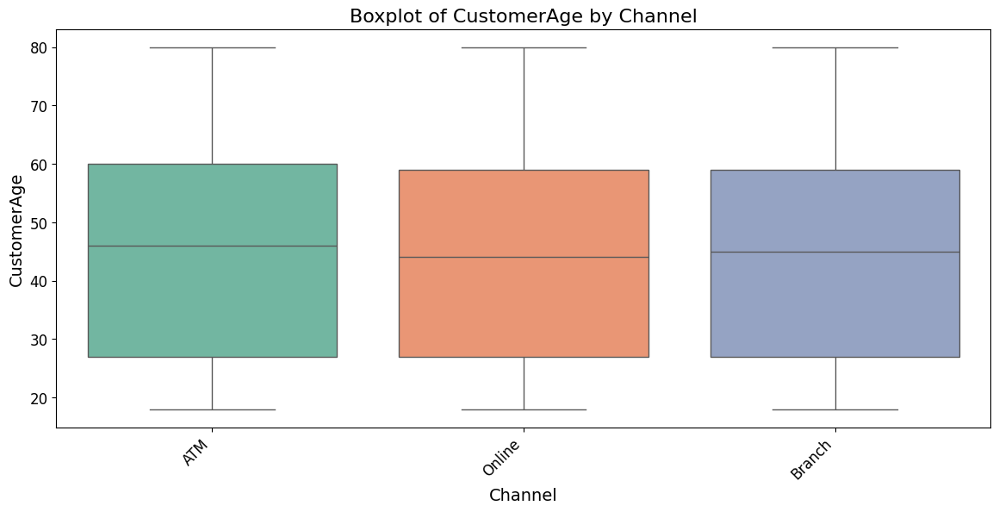

C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\4166861010.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=df, palette='Set2')


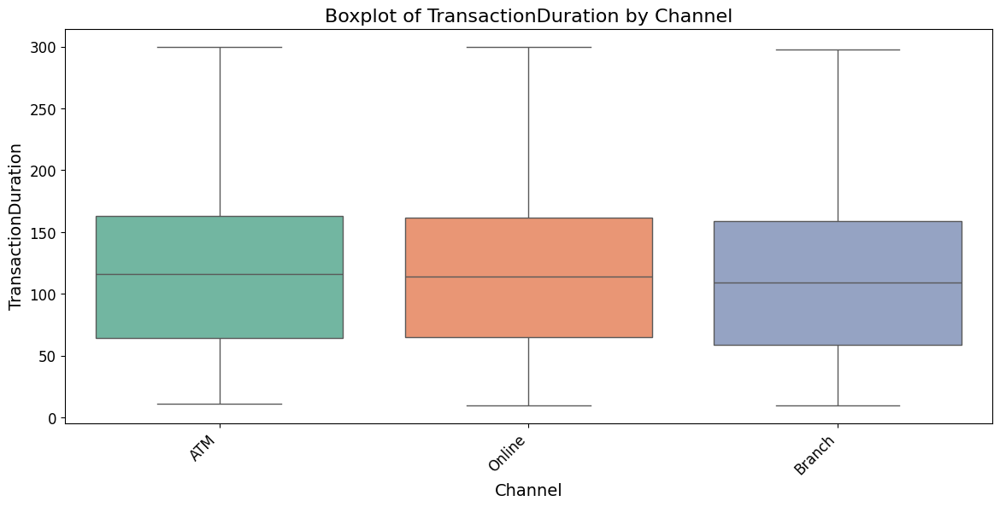

C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\4166861010.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=df, palette='Set2')


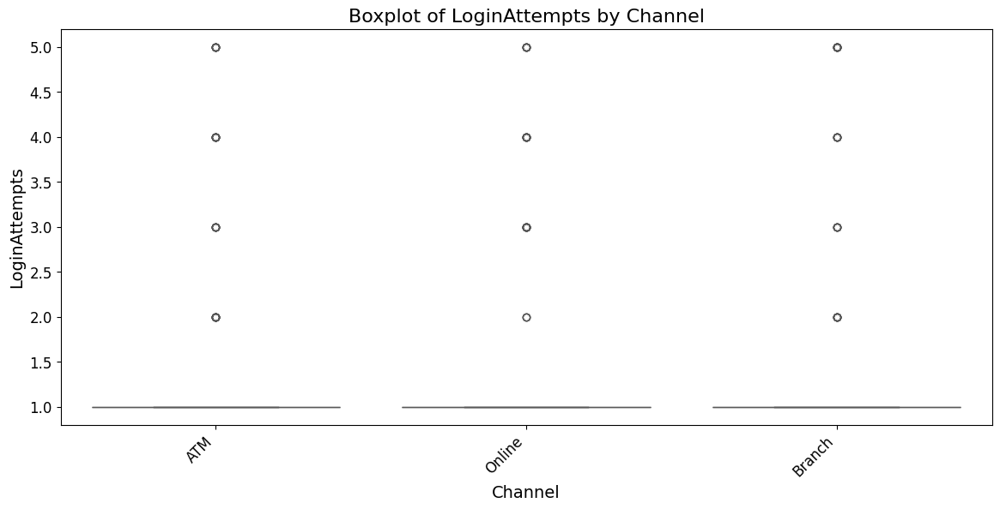

C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\4166861010.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=df, palette='Set2')


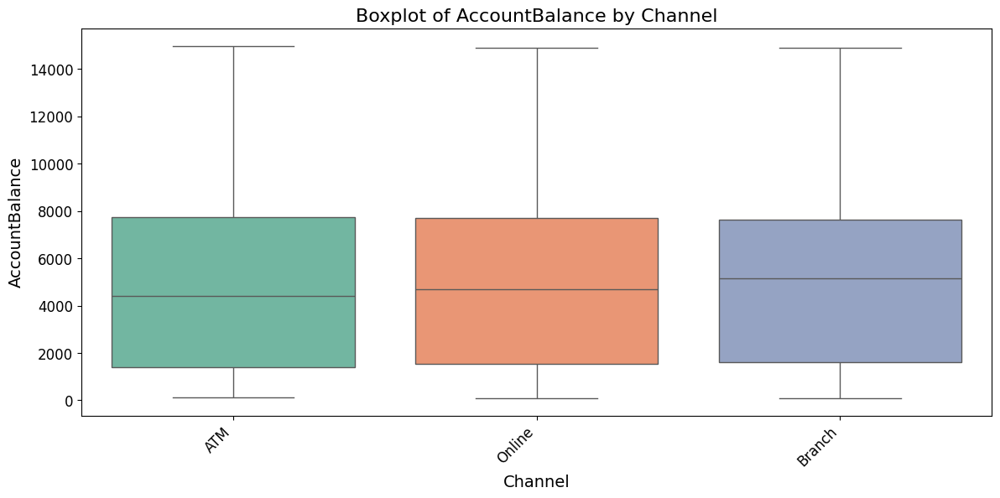

C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\4166861010.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=df, palette='Set2')


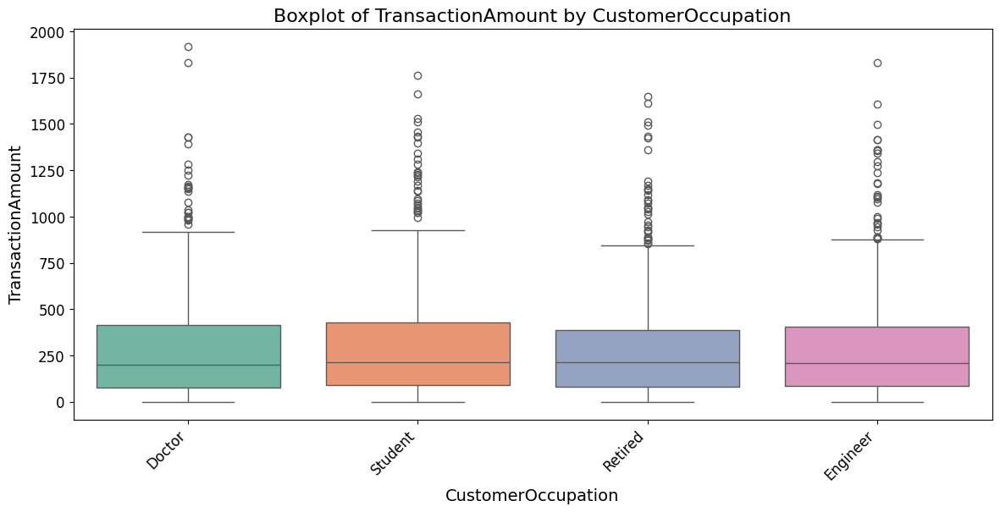

C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\4166861010.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=df, palette='Set2')


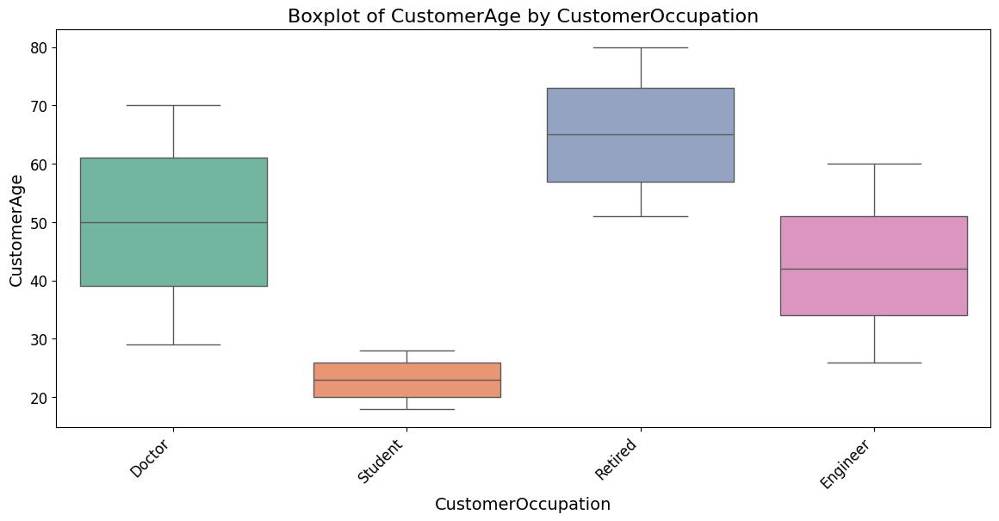

C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\4166861010.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=df, palette='Set2')


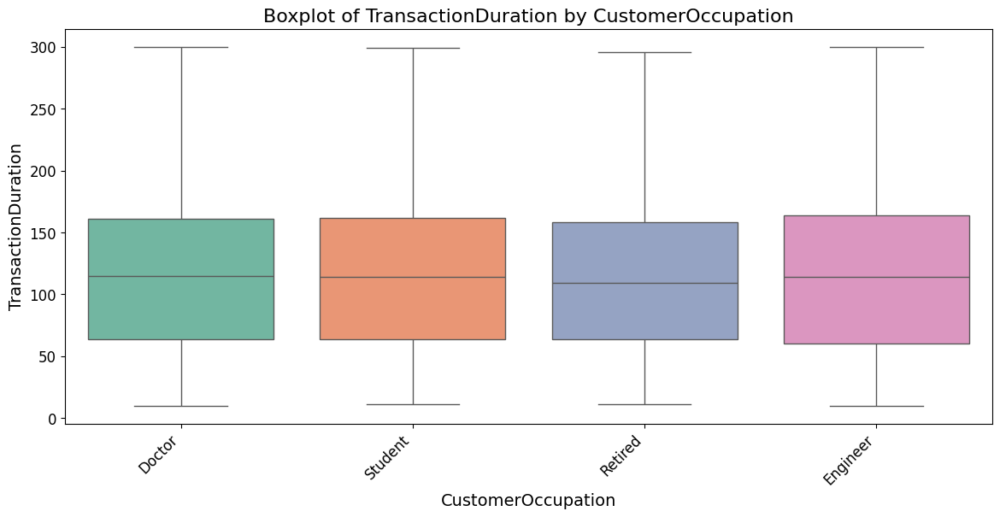

C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\4166861010.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=df, palette='Set2')


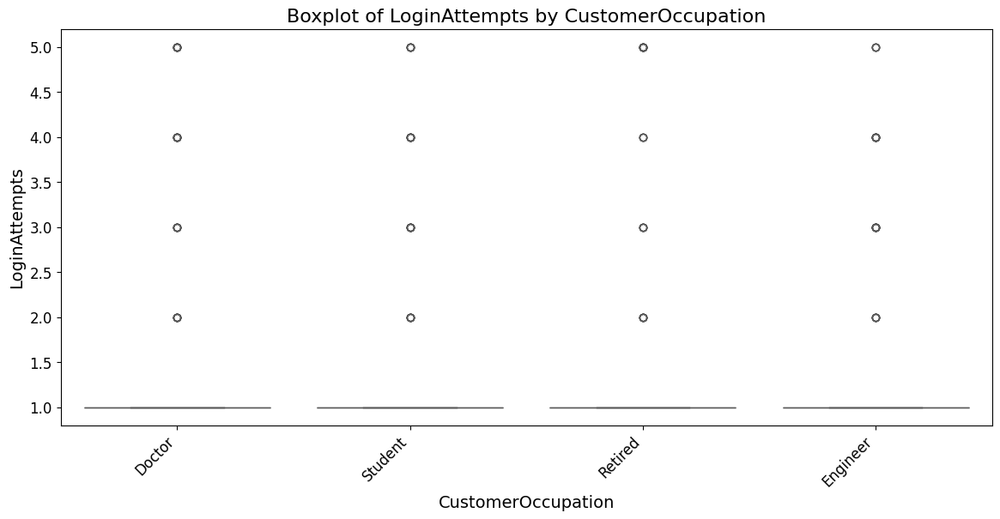

C:\Users\ramch\AppData\Local\Temp\ipykernel_17960\4166861010.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=df, palette='Set2')


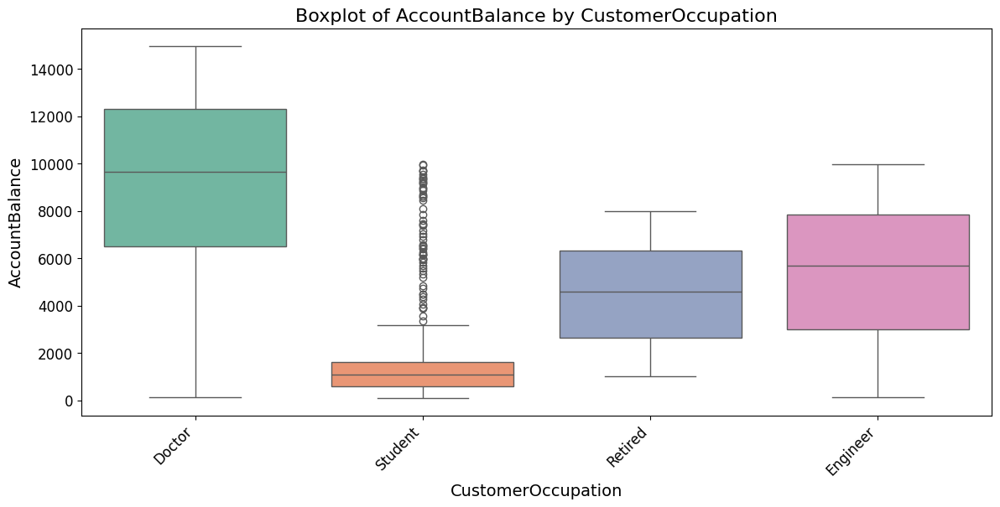

In [36]:
# Boxplot for Numeric vs Categorical
for cat_col in categorical_cols:
    for num_col in numeric_cols:
        plt.figure(figsize=(14, 6))
        sns.boxplot(x=cat_col, y=num_col, data=df, palette='Set2')
        plt.title(f'Boxplot of {num_col} by {cat_col}', fontsize=16)
        plt.xlabel(cat_col, fontsize=14)
        plt.ylabel(num_col, fontsize=14)
        plt.xticks(rotation=45, fontsize=12, ha='right')
        plt.yticks(fontsize=12)
        plt.show()

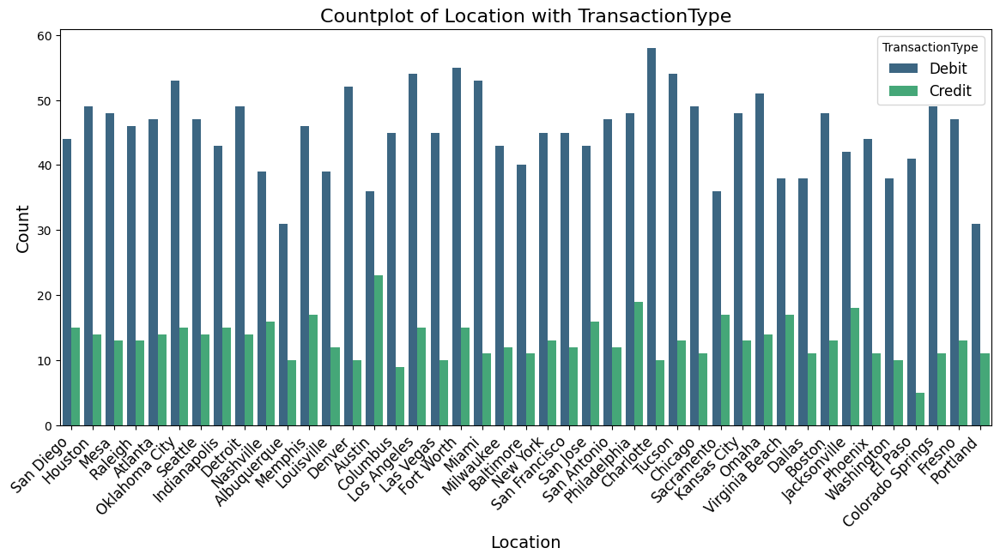

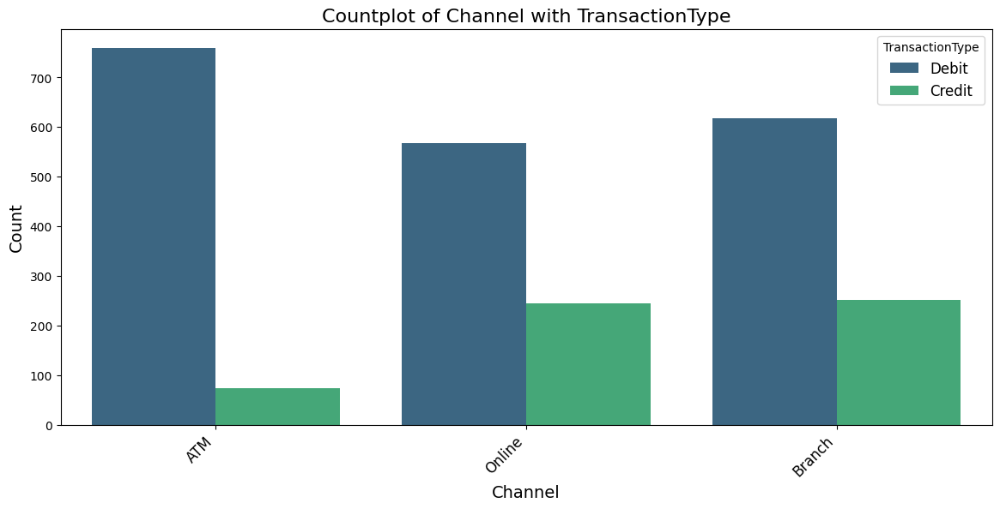

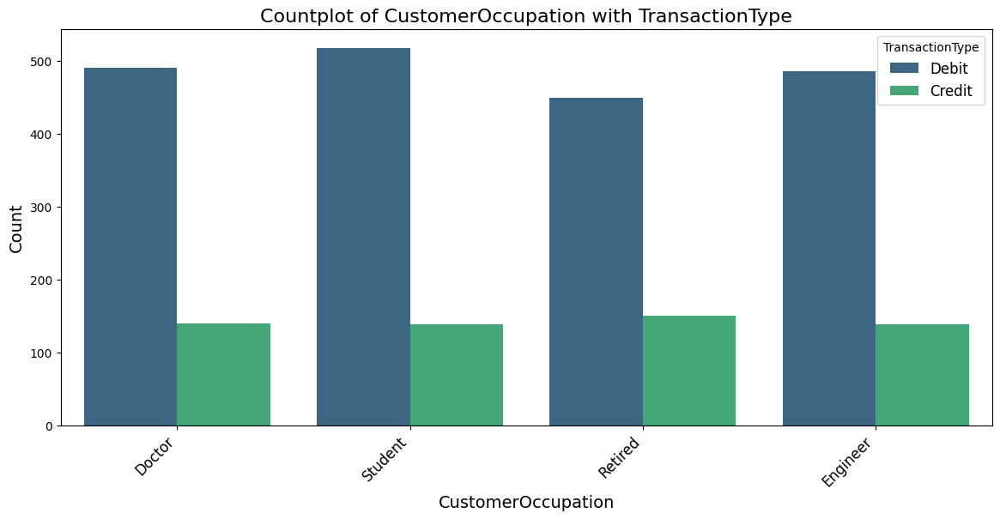

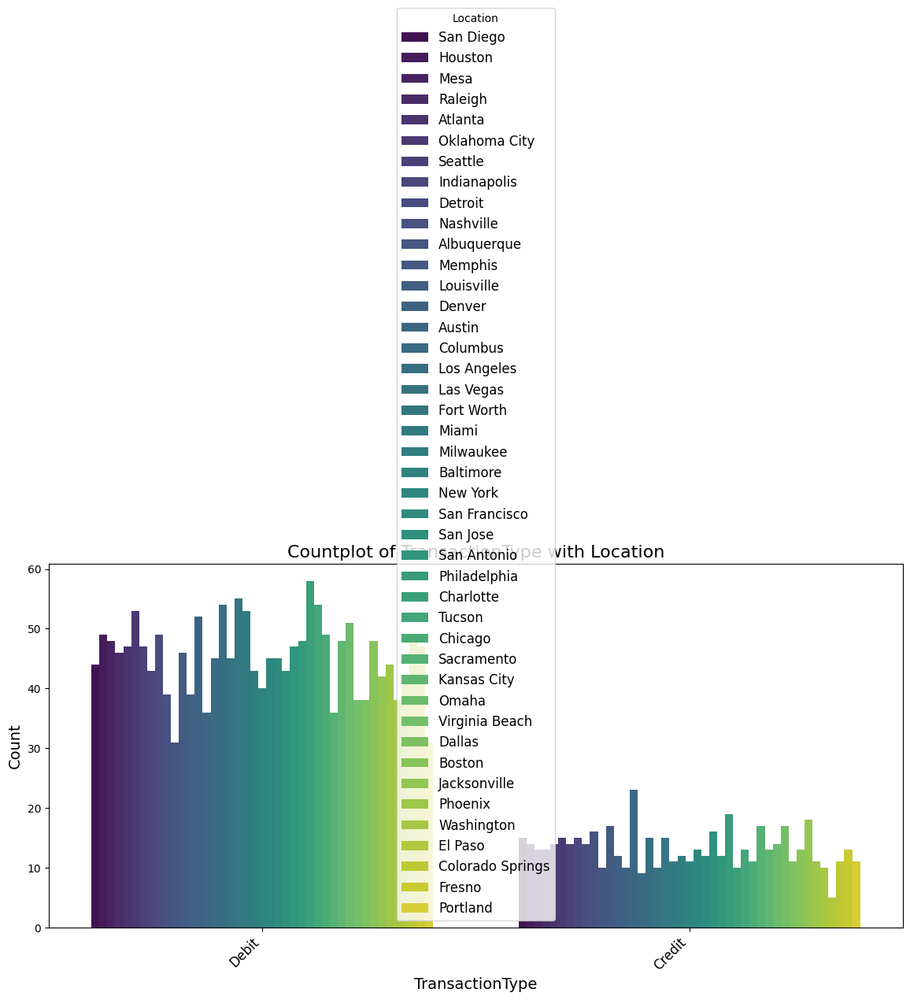

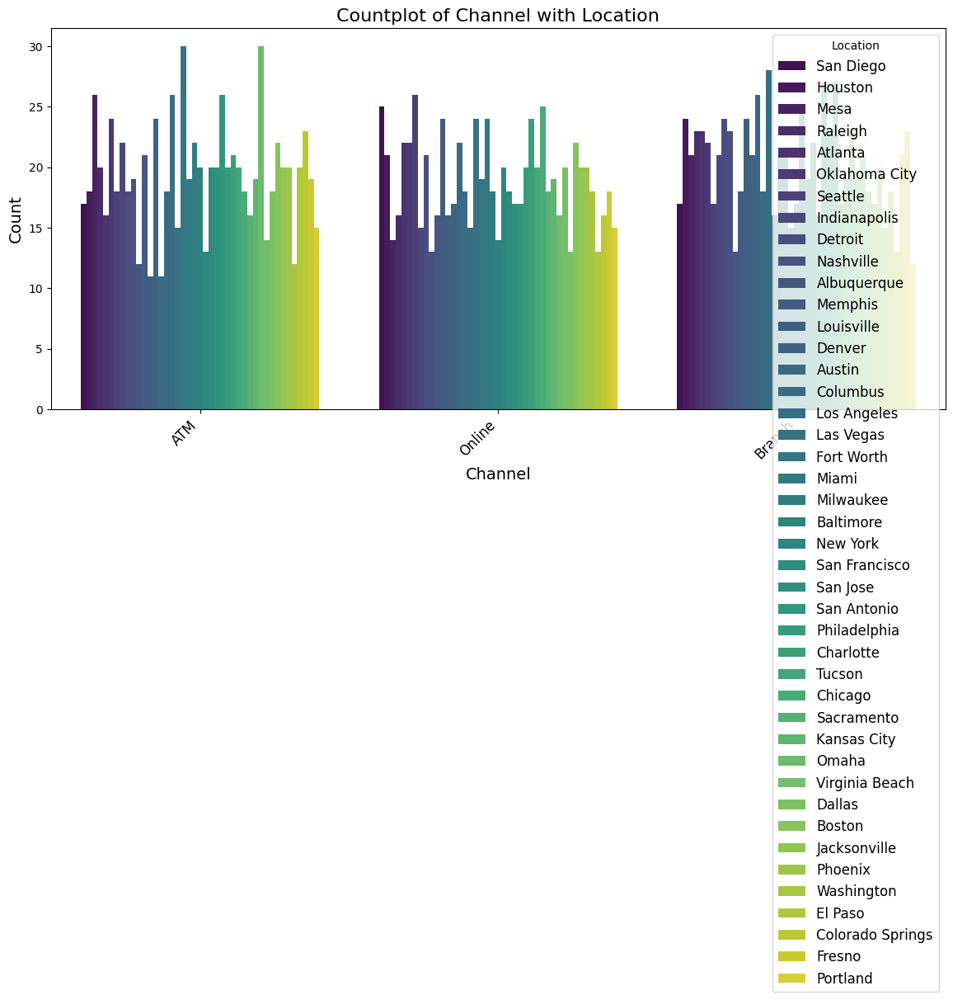

...

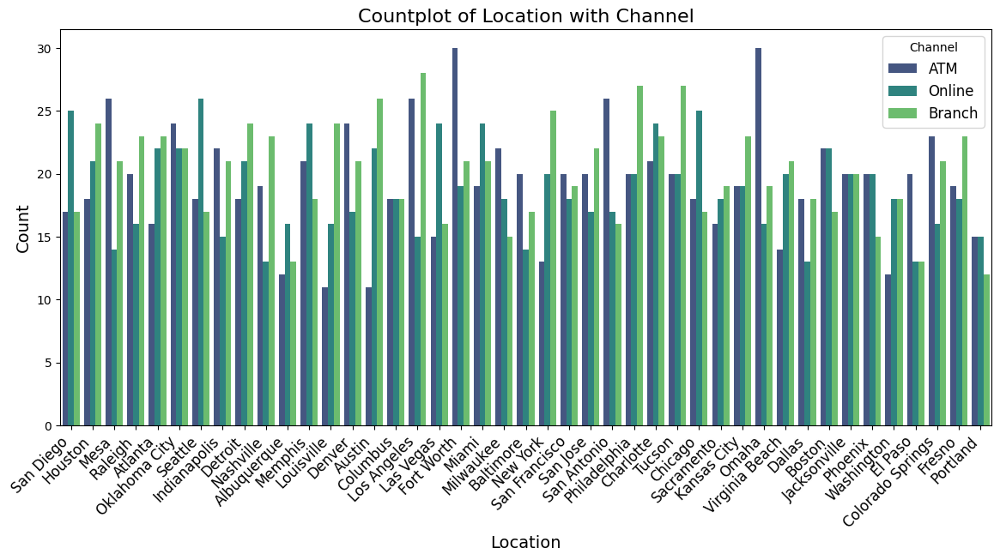

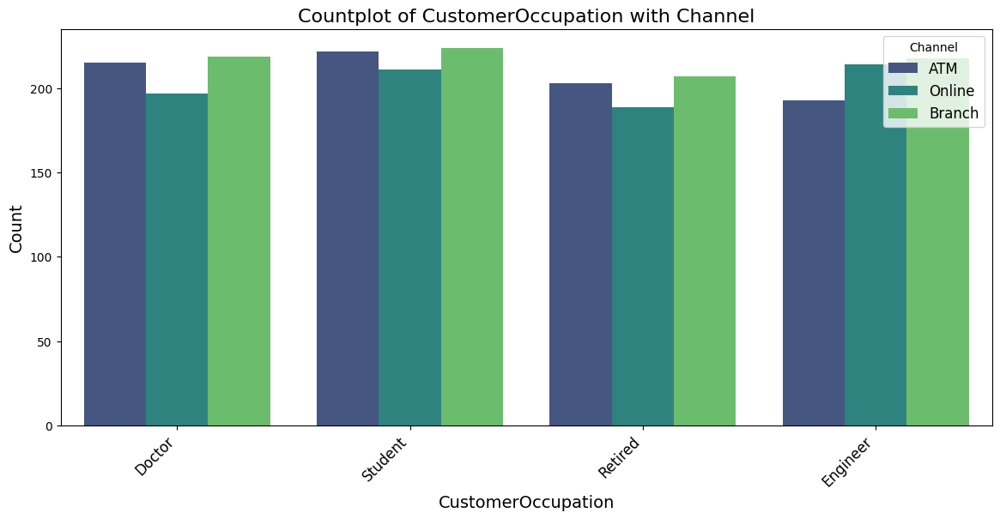

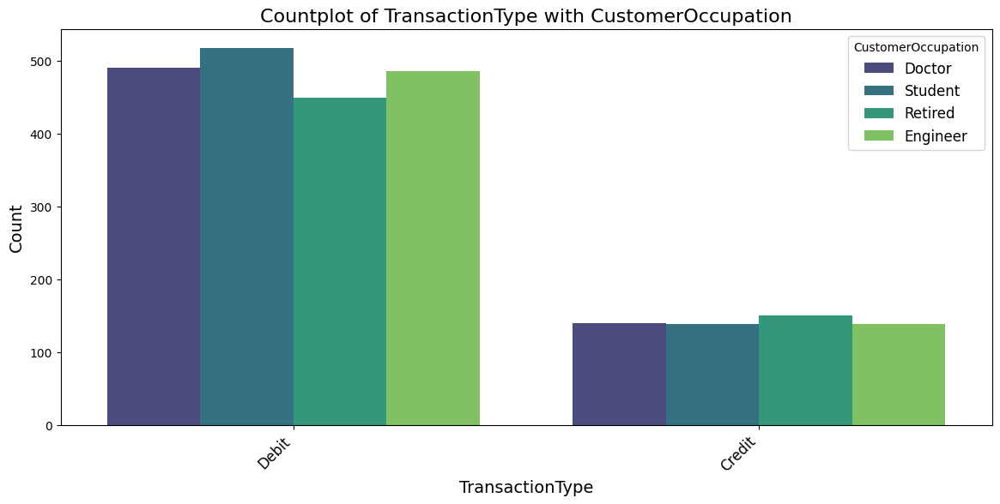

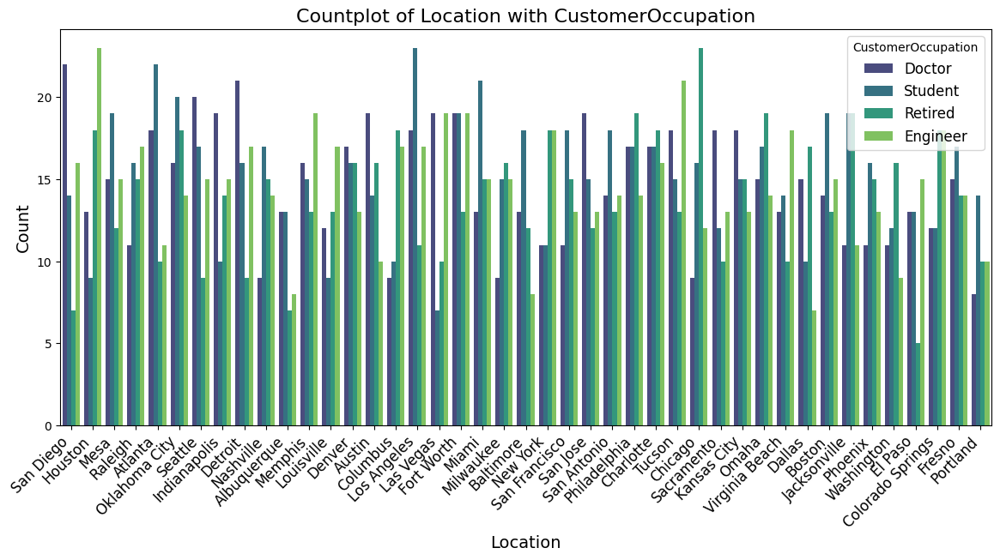

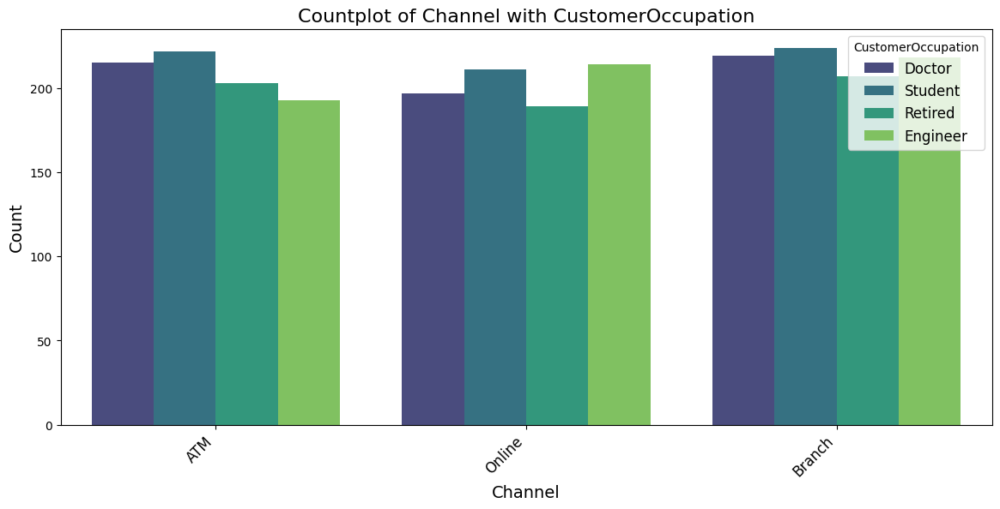

In [38]:
# Countplot with Hue for Categorical vs Categorical
for cat1 in categorical_cols:
    for cat2 in categorical_cols:
        if cat1 != cat2:  # Avoid self-comparison
            plt.figure(figsize=(14, 6))
            sns.countplot(x=cat2, hue=cat1, data=df, palette='viridis')
            plt.title(f'Countplot of {cat2} with {cat1}', fontsize=16)
            plt.xlabel(cat2, fontsize=14)
            plt.ylabel('Count', fontsize=14)
            plt.xticks(rotation=45, fontsize=12, ha='right')
            plt.legend(title=cat1, fontsize=12)
            plt.show()

### Multivaiate Analysis

c:\Users\ramch\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


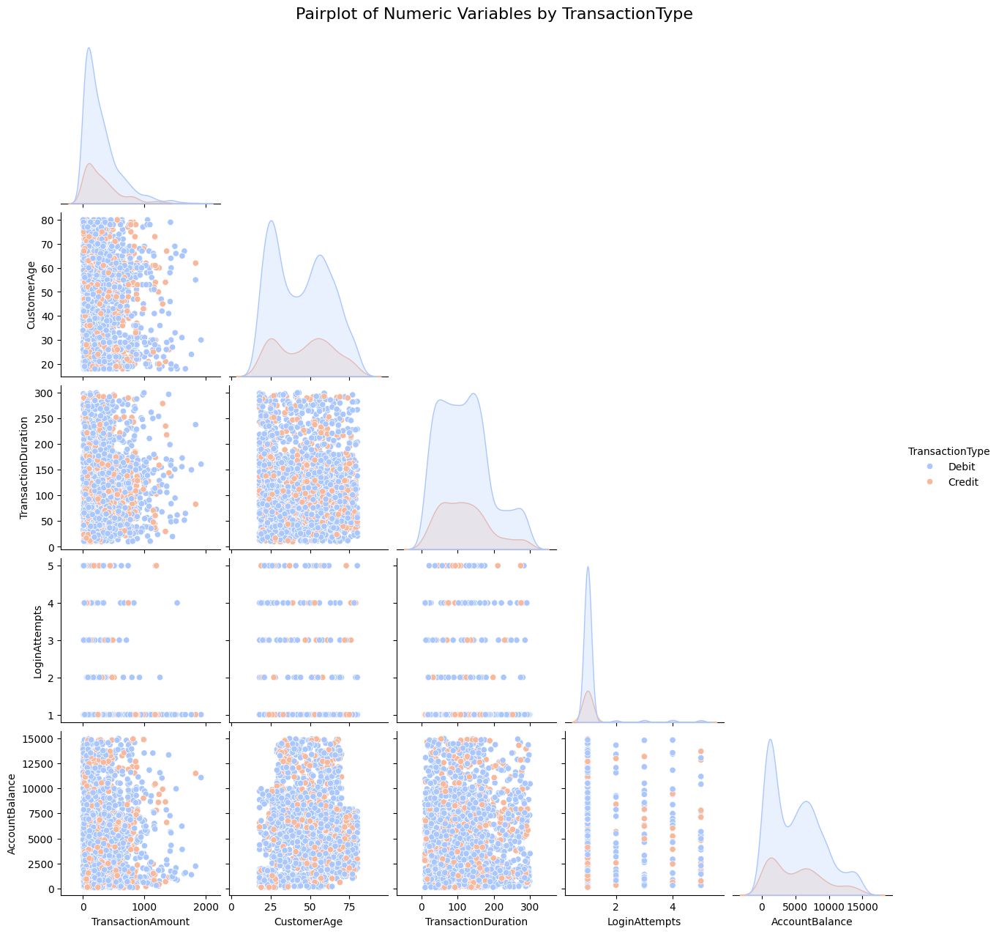

In [ ]:
# pairplots of numeric features
sns.pairplot(df, vars=numeric_cols, hue='TransactionType', palette='coolwarm', corner=True, diag_kind='kde')
plt.suptitle('Pairplot of Numeric Variables by TransactionType', fontsize=16, y=1.02)
plt.show()

In [47]:
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
categorical_cols = df.select_dtypes(include=['object', 'category']).columns

In [48]:
categorical_cols

Index(['TransactionID', 'AccountID', 'TransactionDate', 'TransactionType',
       'Location', 'DeviceID', 'IP Address', 'MerchantID', 'Channel',
       'CustomerOccupation', 'PreviousTransactionDate'],
      dtype='object')

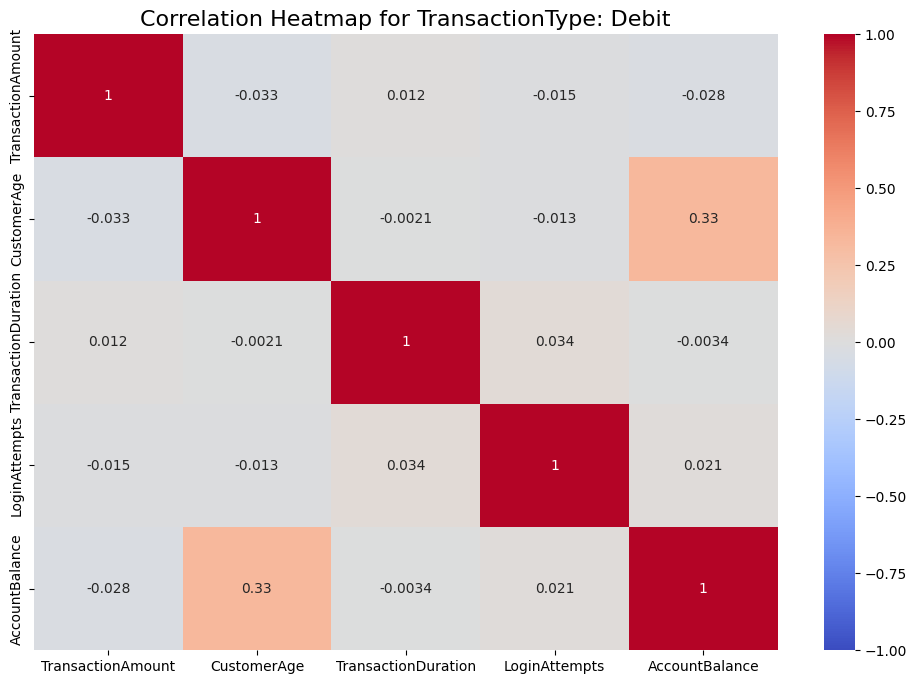

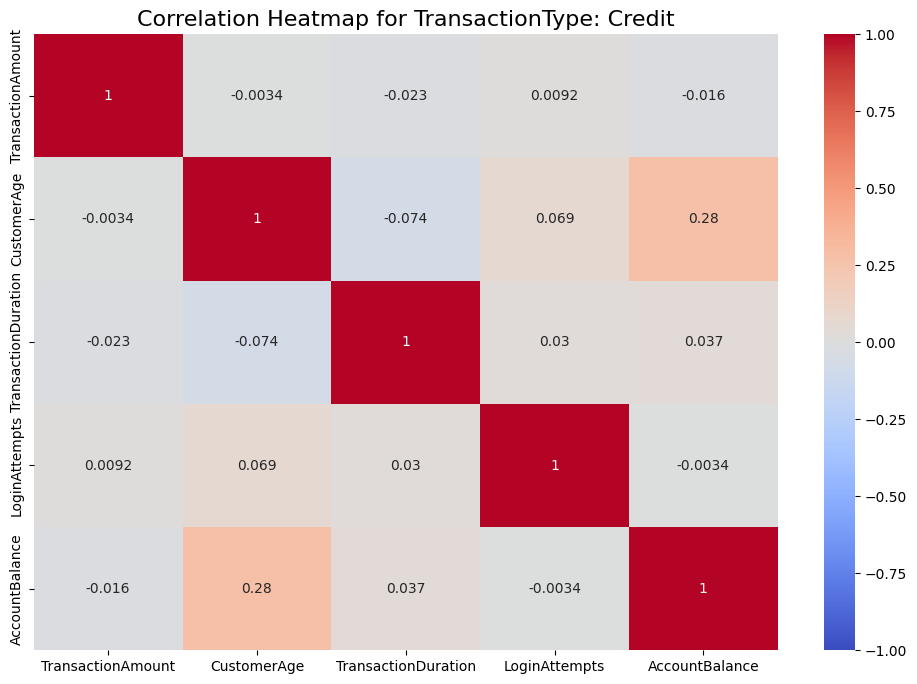

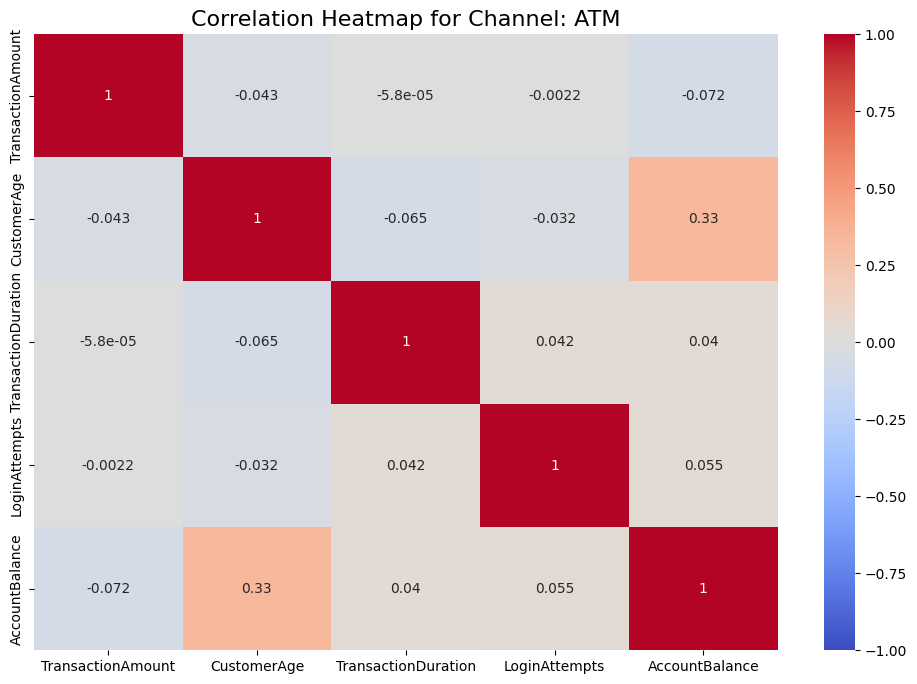

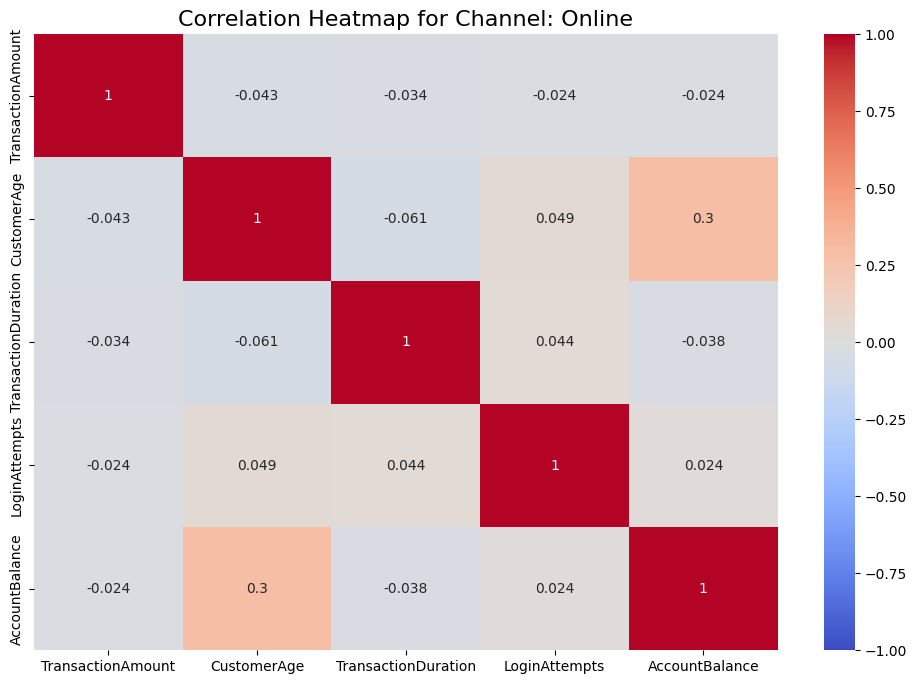

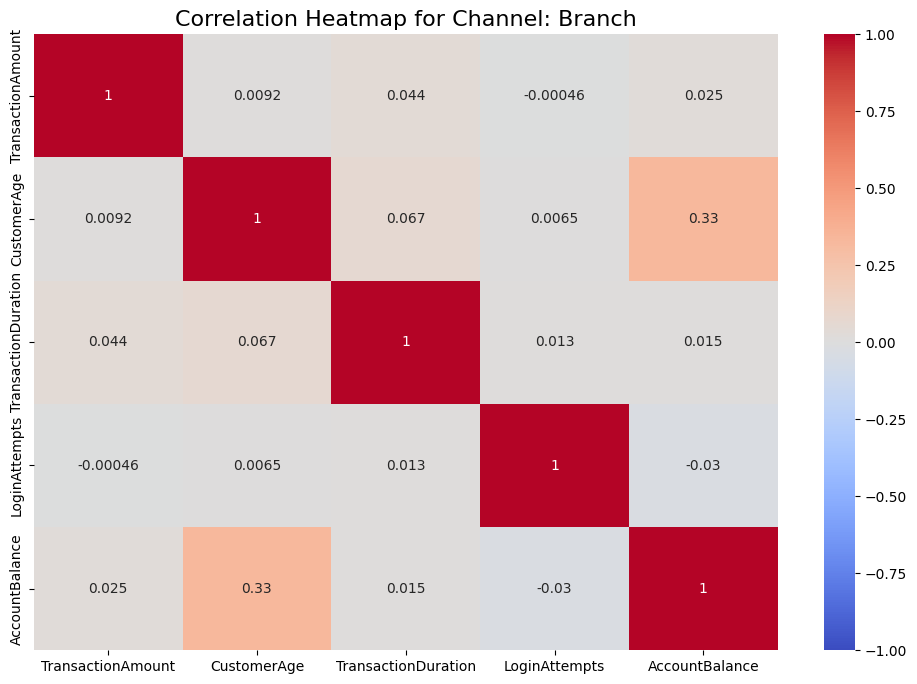

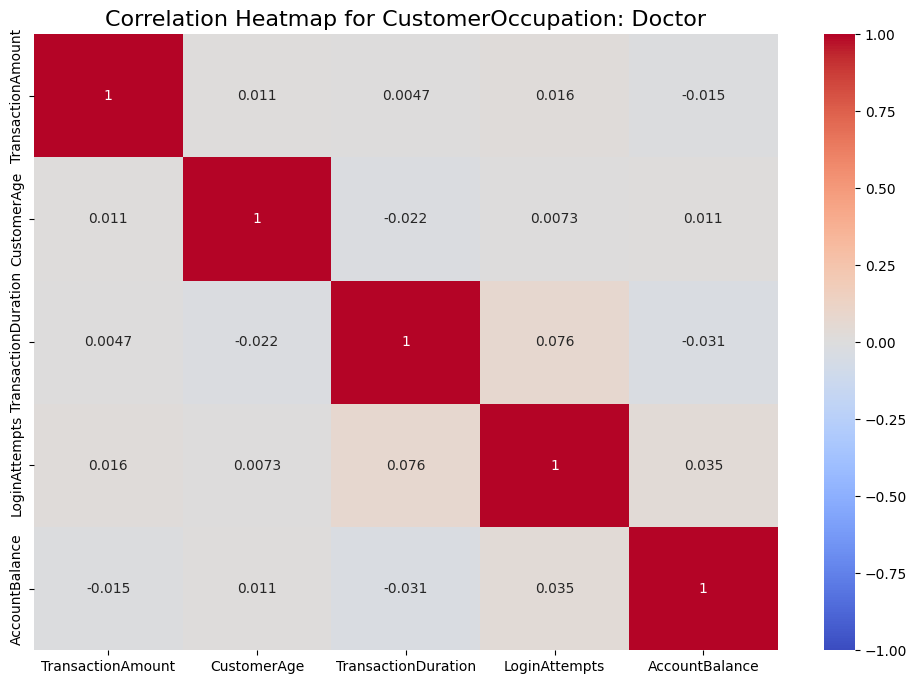

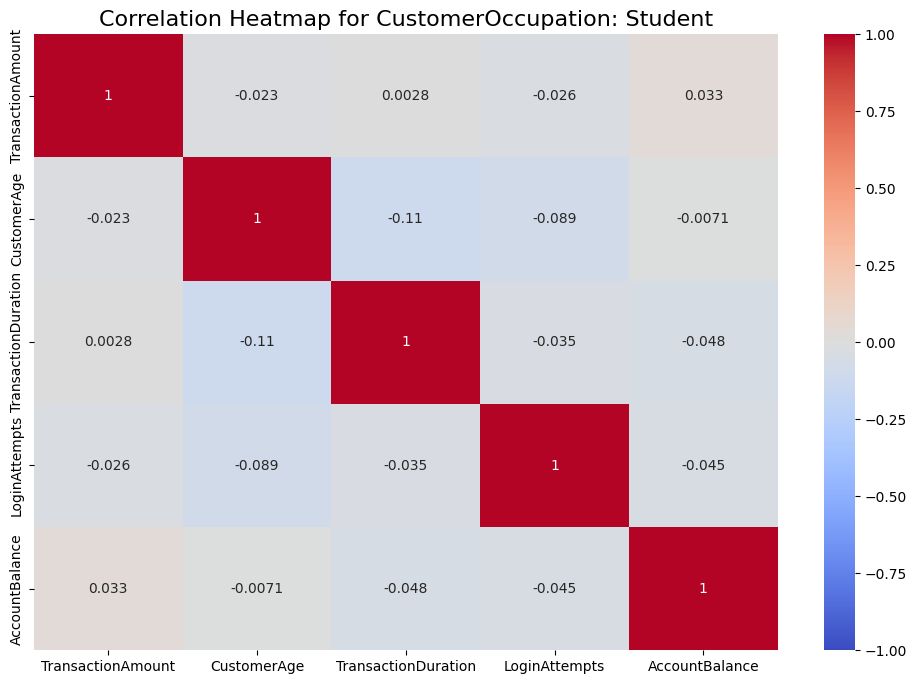

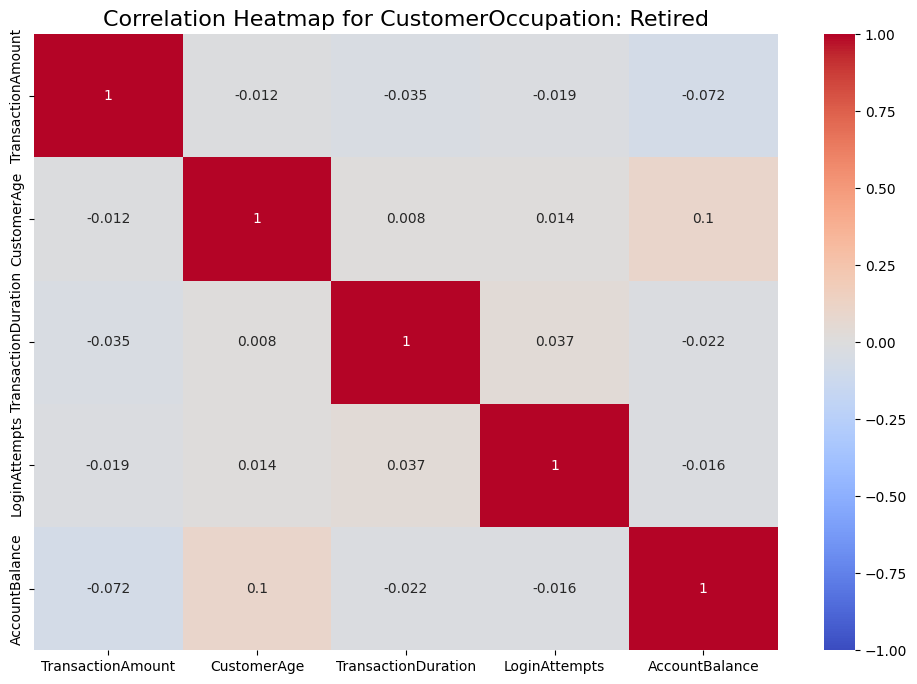

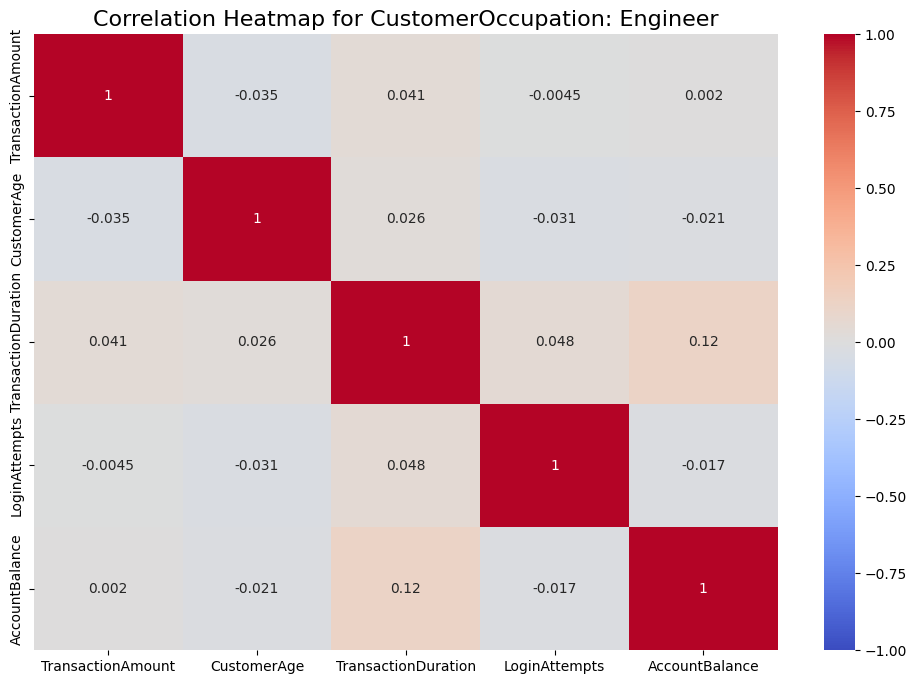

In [49]:
# Generate heatmaps for each categorical variable
for cat_col in ['TransactionType', 'Channel', 'CustomerOccupation']:
    for cat_value in df[cat_col].unique():
        subset = df[df[cat_col] == cat_value]
        
        # Skip if subset is too small
        if len(subset) < 2:
            continue
        
        plt.figure(figsize=(12, 8))
        plt.title(f'Correlation Heatmap for {cat_col}: {cat_value}', fontsize=16)
        sns.heatmap(subset[numeric_cols].corr(numeric_only=True), annot=True, cmap='coolwarm', vmin=-1, vmax=1)
        plt.show()

c:\Users\ramch\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


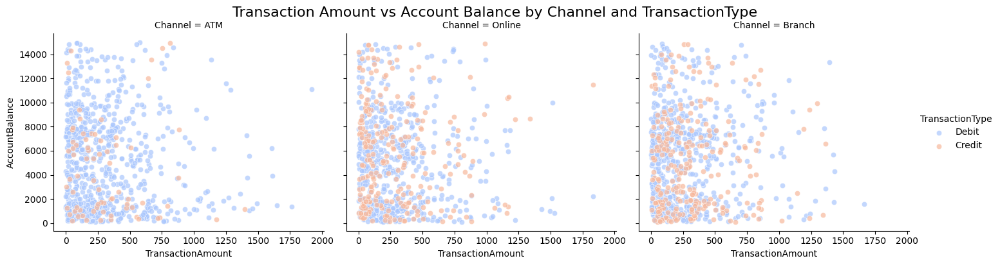

c:\Users\ramch\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


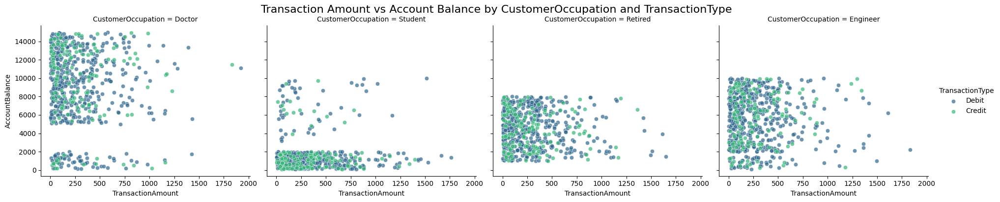

In [50]:
# FacetGrid: Transaction Amount vs Account Balance by Channel and TransactionType
g = sns.FacetGrid(df, col="Channel", hue="TransactionType", palette="coolwarm", height=4, aspect=1.2)
g.map_dataframe(sns.scatterplot, x="TransactionAmount", y="AccountBalance", alpha=0.7)
g.add_legend()
g.fig.suptitle('Transaction Amount vs Account Balance by Channel and TransactionType', fontsize=16, y=1.02)
plt.show()

# FacetGrid: Transaction Amount vs Account Balance by CustomerOccupation
g = sns.FacetGrid(df, col="CustomerOccupation", hue="TransactionType", palette="viridis", height=4, aspect=1.2)
g.map_dataframe(sns.scatterplot, x="TransactionAmount", y="AccountBalance", alpha=0.7)
g.add_legend()
g.fig.suptitle('Transaction Amount vs Account Balance by CustomerOccupation and TransactionType', fontsize=16, y=1.02)
plt.show()

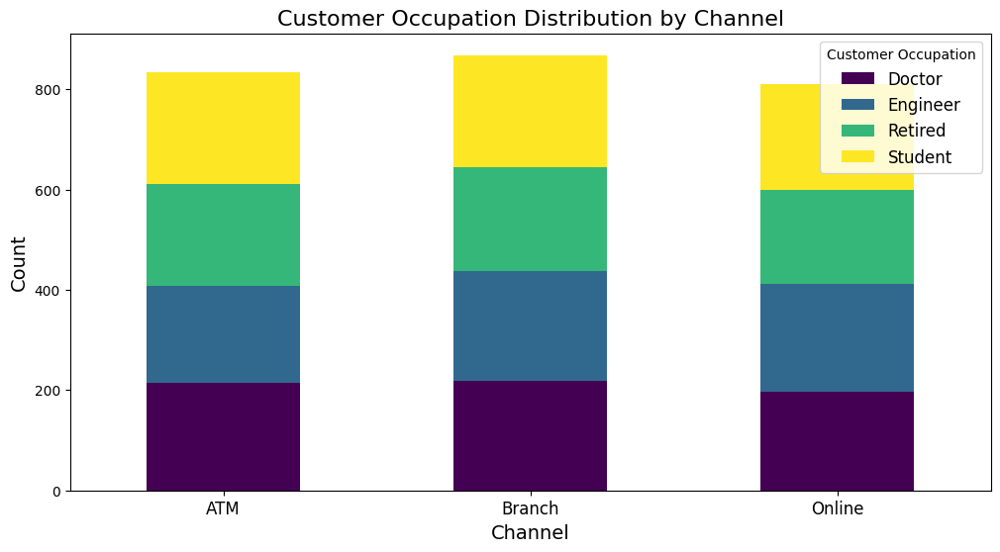

In [52]:
# Stacked Bar Chart: Customer Occupation Distribution by Channel
occupation_channel = df.groupby(['Channel', 'CustomerOccupation']).size().unstack()
occupation_channel.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='viridis')
plt.title('Customer Occupation Distribution by Channel', fontsize=16)
plt.xlabel('Channel', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=0, fontsize=12)
plt.legend(title='Customer Occupation', fontsize=12)
plt.show()

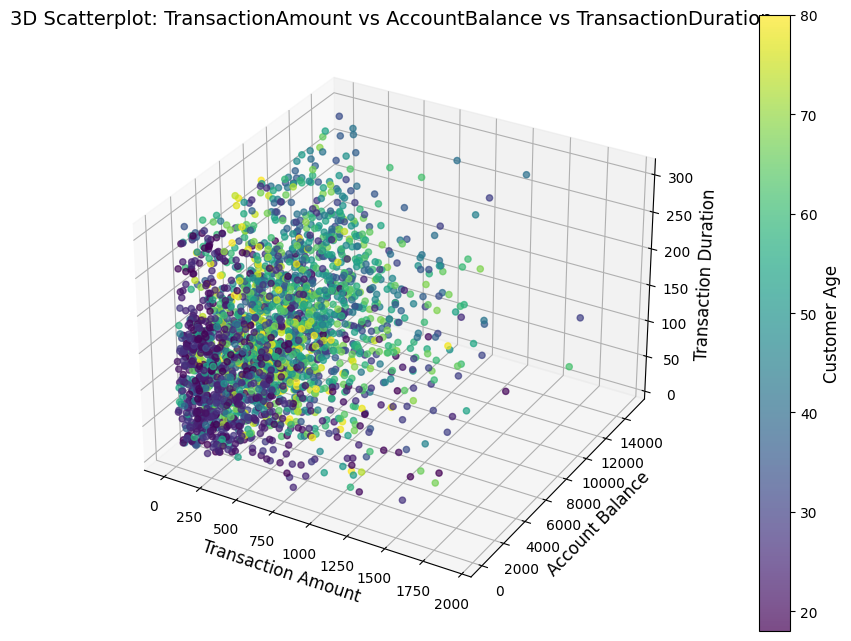

In [54]:
# 3D Scatterplot: Visualize three numeric variables

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(
    df['TransactionAmount'], 
    df['AccountBalance'], 
    df['TransactionDuration'], 
    c=df['CustomerAge'], 
    cmap='viridis', 
    alpha=0.7
)
ax.set_xlabel('Transaction Amount', fontsize=12)
ax.set_ylabel('Account Balance', fontsize=12)
ax.set_zlabel('Transaction Duration', fontsize=12)
plt.title('3D Scatterplot: TransactionAmount vs AccountBalance vs TransactionDuration', fontsize=14)
cbar = fig.colorbar(scatter, ax=ax, pad=0.1)
cbar.set_label('Customer Age', fontsize=12)
plt.show()

# Prepare Data for ML Algorithm

## Data Cleaning

In [55]:
# no missing values

## Pipeline

In [56]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2512 entries, 0 to 2511
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   TransactionID            2512 non-null   object 
 1   AccountID                2512 non-null   object 
 2   TransactionAmount        2512 non-null   float64
 3   TransactionDate          2512 non-null   object 
 4   TransactionType          2512 non-null   object 
 5   Location                 2512 non-null   object 
 6   DeviceID                 2512 non-null   object 
 7   IP Address               2512 non-null   object 
 8   MerchantID               2512 non-null   object 
 9   Channel                  2512 non-null   object 
 10  CustomerAge              2512 non-null   int64  
 11  CustomerOccupation       2512 non-null   object 
 12  TransactionDuration      2512 non-null   int64  
 13  LoginAttempts            2512 non-null   int64  
 14  AccountBalance          

In [58]:
# drop features like TransactionID, AccountID, Location, DeviceID, IP addr, MerchantID
# to lose a bit only take time from TransactionDate, PreviousTransactionDate
# numerice features are TransactionAmount, Age, Duration, Login Attempts, AccountBalance
# categorical features TransactionType, Channel, CustomerOccupation

In [59]:
# drop unnecessary features
df = df.drop(columns=['TransactionID', 'AccountID', 'Location', 'DeviceID', 'IP Address', 'MerchantID'])

In [60]:
# Extract time (in seconds) from TransactionDate and PreviousTransactionDate
df['TransactionDate'] = pd.to_datetime(df['TransactionDate'], errors='coerce').dt.hour * 3600 + \
                        pd.to_datetime(df['TransactionDate'], errors='coerce').dt.minute * 60 + \
                        pd.to_datetime(df['TransactionDate'], errors='coerce').dt.second

df['PreviousTransactionDate'] = pd.to_datetime(df['PreviousTransactionDate'], errors='coerce').dt.hour * 3600 + \
                                pd.to_datetime(df['PreviousTransactionDate'], errors='coerce').dt.minute * 60 + \
                                pd.to_datetime(df['PreviousTransactionDate'], errors='coerce').dt.second

In [61]:
# Define feature categories
numeric_features = ['TransactionAmount', 'CustomerAge', 'TransactionDuration', 'LoginAttempts', 'AccountBalance', 
                    'TransactionDate', 'PreviousTransactionDate']
categorical_features = ['TransactionType', 'Channel', 'CustomerOccupation']

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

In [63]:
from sklearn.preprocessing import OneHotEncoder

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

In [64]:
from sklearn.compose import ColumnTransformer

pipeline = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ]
)

## Create Test Set

In [70]:
from sklearn.model_selection import train_test_split

X_train, X_test = train_test_split(df, test_size=0.2, random_state=42)


In [71]:
X_train = pipeline.fit_transform(X_train)
X_test = pipeline.transform(X_test)

In [72]:
X_train.shape

(2009, 16)

In [73]:
X_test.shape

(503, 16)

# ML ALgorithms

## Dimensionality Reduction

### PCA

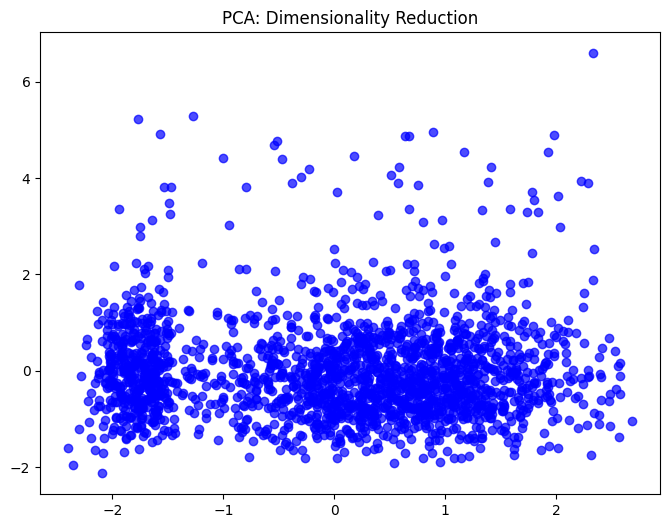

In [77]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_train)

# Plot the data
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], alpha=0.7, color='blue')
plt.title('PCA: Dimensionality Reduction')
plt.show()

In [87]:
import warnings
warnings.filterwarnings('ignore')

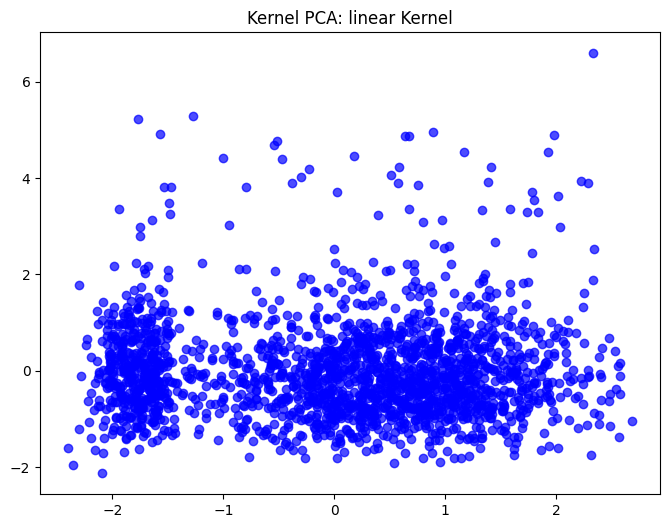

In [88]:
from sklearn.decomposition import KernelPCA
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer
import numpy as np

# Define a custom scoring function (reconstruction error)
def reconstruction_error(kpca, X):
    X_transformed = kpca.fit_transform(X)
    X_reconstructed = kpca.inverse_transform(X_transformed)
    return -np.mean(np.square(X - X_reconstructed))

# Wrap the scoring function for GridSearchCV
scorer = make_scorer(reconstruction_error, greater_is_better=False)

# Kernel PCA and grid search parameters
kpca = KernelPCA(n_components=2, fit_inverse_transform=True)
param_grid = {'kernel': ['linear', 'poly', 'rbf', 'sigmoid', 'cosine'],
              'gamma': [0.1, 0.5, 1, 5, 10]}

# Perform grid search
grid_search = GridSearchCV(kpca, param_grid, cv=5, scoring=scorer)
grid_search.fit(X_train)

# Best model
best_kpca = grid_search.best_estimator_
X_kpca = best_kpca.fit_transform(X_train)

# Plot the data
plt.figure(figsize=(8, 6))
plt.scatter(X_kpca[:, 0], X_kpca[:, 1], alpha=0.7, color='blue')
plt.title(f'Kernel PCA: {best_kpca.kernel} Kernel')
plt.show()

### LLE

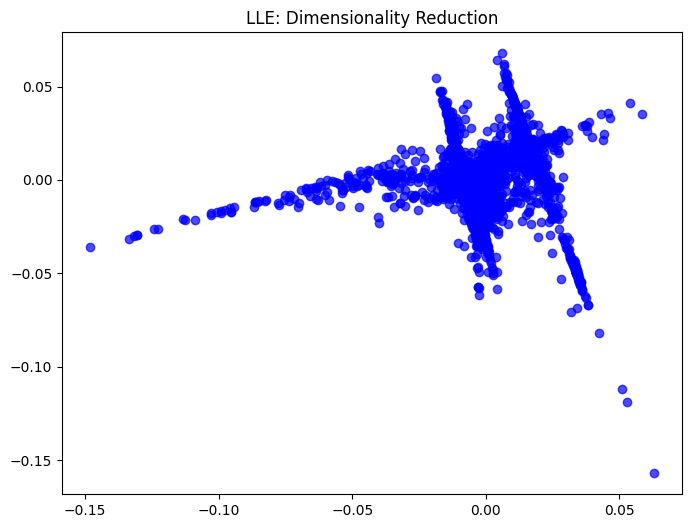

In [78]:
from sklearn.manifold import LocallyLinearEmbedding

lle = LocallyLinearEmbedding(n_components=2)
X_lle = lle.fit_transform(X_train)

# Plot the data
plt.figure(figsize=(8, 6))
plt.scatter(X_lle[:, 0], X_lle[:, 1], alpha=0.7, color='blue')
plt.title('LLE: Dimensionality Reduction')
plt.show()

### Random Projections

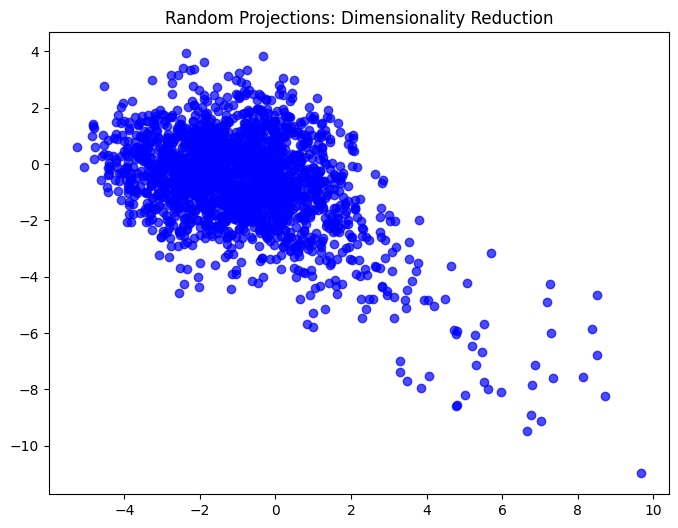

In [81]:
from sklearn.random_projection import GaussianRandomProjection

rp = GaussianRandomProjection(n_components=2, random_state=42)
X_rp = rp.fit_transform(X_train)

# Plot the data
plt.figure(figsize=(8, 6))
plt.scatter(X_rp[:, 0], X_rp[:, 1], alpha=0.7, color='blue')
plt.title('Random Projections: Dimensionality Reduction')
plt.show()

### MDS

c:\Users\ramch\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\manifold\_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


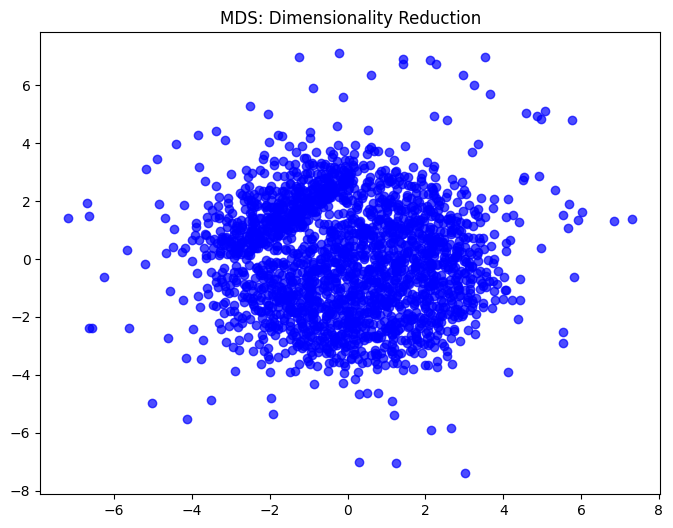

In [82]:
from sklearn.manifold import MDS

mds = MDS(n_components=2, random_state=42)
X_mds = mds.fit_transform(X_train)

# Plot the data
plt.figure(figsize=(8, 6))
plt.scatter(X_mds[:, 0], X_mds[:, 1], alpha=0.7, color='blue')
plt.title('MDS: Dimensionality Reduction')
plt.show()

### Isomap

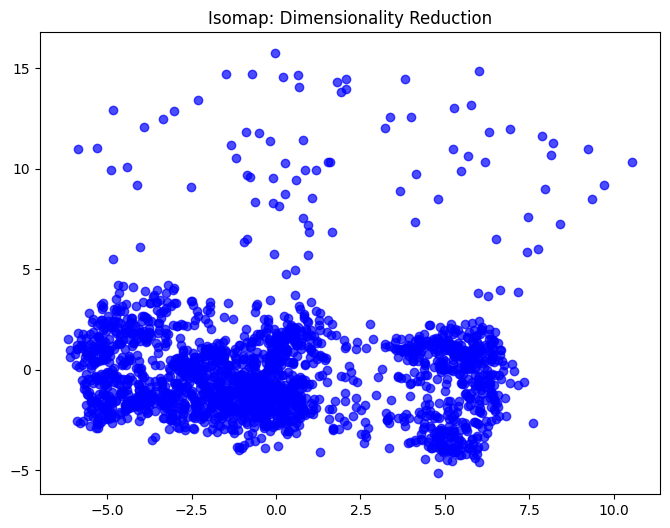

In [83]:
from sklearn.manifold import Isomap

isomap = Isomap(n_components=2)
X_isomap = isomap.fit_transform(X_train)

# Plot the data
plt.figure(figsize=(8, 6))
plt.scatter(X_isomap[:, 0], X_isomap[:, 1], alpha=0.7, color='blue')
plt.title('Isomap: Dimensionality Reduction')
plt.show()

## t-SNE

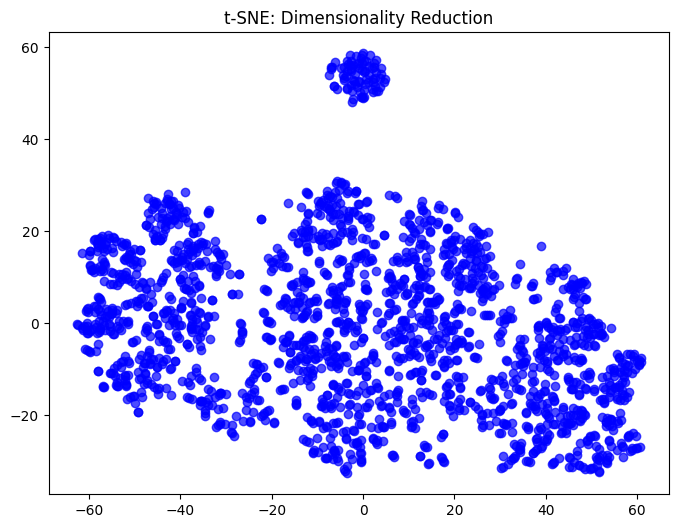

In [84]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_train)

# Plot the data
plt.figure(figsize=(8, 6))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], alpha=0.7, color='blue')
plt.title('t-SNE: Dimensionality Reduction')
plt.show()

In [89]:
# MDS, RP, TSNE look good

## Clustering and Anomaly Detection

### K-Means

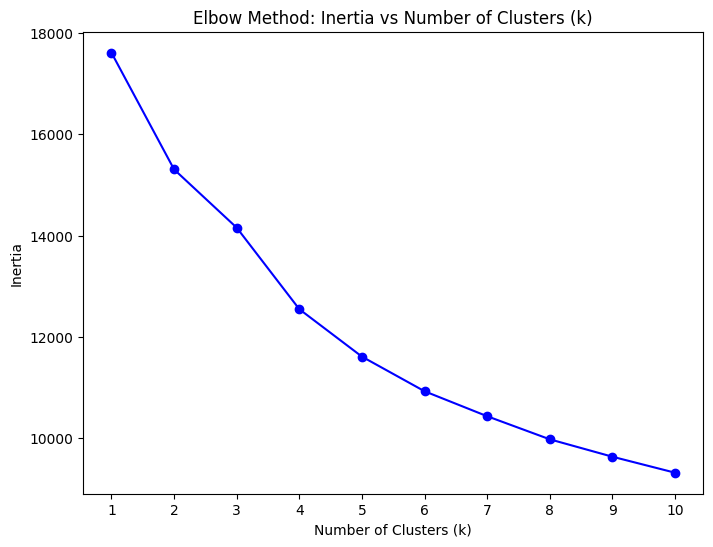

In [92]:
from sklearn.cluster import KMeans
# elbow method

# Range of cluster numbers to test
k_values = range(1, 11)
inertias = []

# Calculate inertia for each k
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_train)
    inertias.append(kmeans.inertia_)

# Plot inertia vs k
plt.figure(figsize=(8, 6))
plt.plot(k_values, inertias, marker='o', color='blue')
plt.title('Elbow Method: Inertia vs Number of Clusters (k)')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.xticks(k_values)
plt.show()

In [91]:
# i can't find clearly

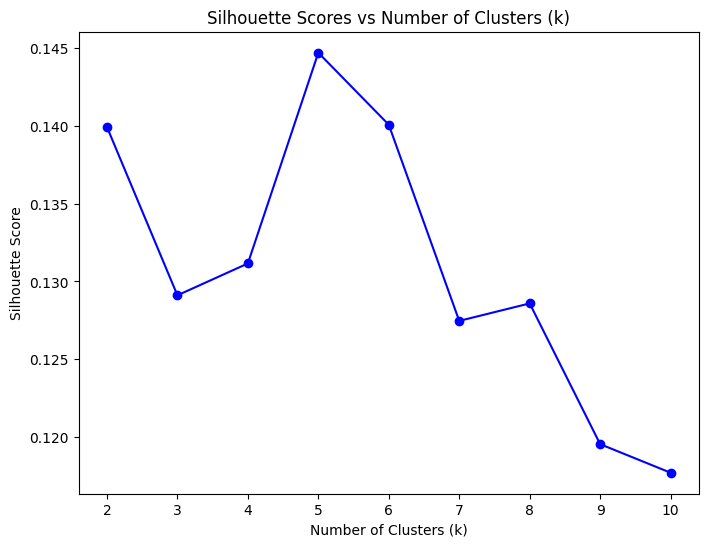

In [93]:
from sklearn.metrics import silhouette_score

# Range of cluster numbers to test
k_values = range(2, 11)
silhouette_scores = []

# Calculate silhouette score for each k
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_train)
    score = silhouette_score(X_train, labels)
    silhouette_scores.append(score)

# Plot silhouette scores vs k
plt.figure(figsize=(8, 6))
plt.plot(k_values, silhouette_scores, marker='o', color='blue')
plt.title('Silhouette Scores vs Number of Clusters (k)')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.xticks(k_values)
plt.show()

In [94]:
# k = 5 is the best

In [ ]:
# Perform K-Means clustering with k=5
kmeans = KMeans(n_clusters=5, random_state=42, n_init='auto')
kmeans_labels = kmeans.fit_predict(X_train)

In [ ]:
# Calculate distances from centroids
centroids = kmeans.cluster_centers_
distances = np.linalg.norm(X_train - centroids[kmeans_labels], axis=1)

# Set threshold: Mean + 3 * Standard Deviation
threshold = distances.mean() + 3 * distances.std()

# Identify anomalies
anomalies = distances > threshold

# Summary of anomalies
print(f"Threshold: {threshold}")
print(f"Total anomalies detected: {np.sum(anomalies)}")

Threshold: 4.726539070835603
Total anomalies detected: 55
Distance: 2.43, Anomaly: False
Distance: 2.63, Anomaly: False
Distance: 2.05, Anomaly: False
Distance: 1.82, Anomaly: False
Distance: 3.18, Anomaly: False
Distance: 3.57, Anomaly: False
Distance: 2.12, Anomaly: False
Distance: 2.36, Anomaly: False
Distance: 1.96, Anomaly: False
Distance: 1.84, Anomaly: False


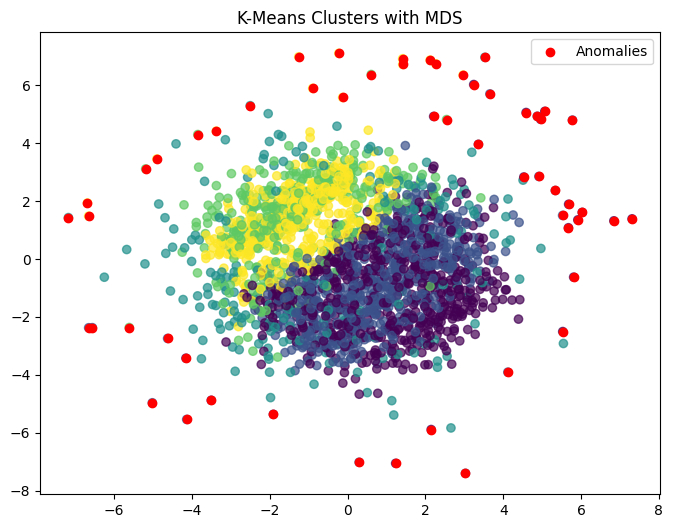

In [ ]:
# MDS
plt.figure(figsize=(8, 6))
plt.scatter(X_mds[:, 0], X_mds[:, 1], c=kmeans_labels, cmap='viridis', alpha=0.7)
plt.scatter(X_mds[anomalies, 0], X_mds[anomalies, 1], color='red', label='Anomalies')
plt.title('K-Means Clusters with MDS')
plt.legend()
plt.show()

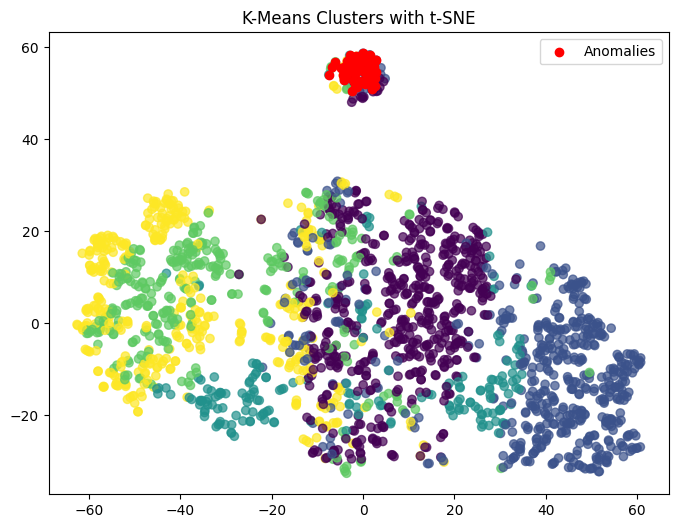

In [ ]:
# TSNE
plt.figure(figsize=(8, 6))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=kmeans_labels, cmap='viridis', alpha=0.7)
plt.scatter(X_tsne[anomalies, 0], X_tsne[anomalies, 1], color='red', label='Anomalies')
plt.title('K-Means Clusters with t-SNE')
plt.legend()
plt.show()

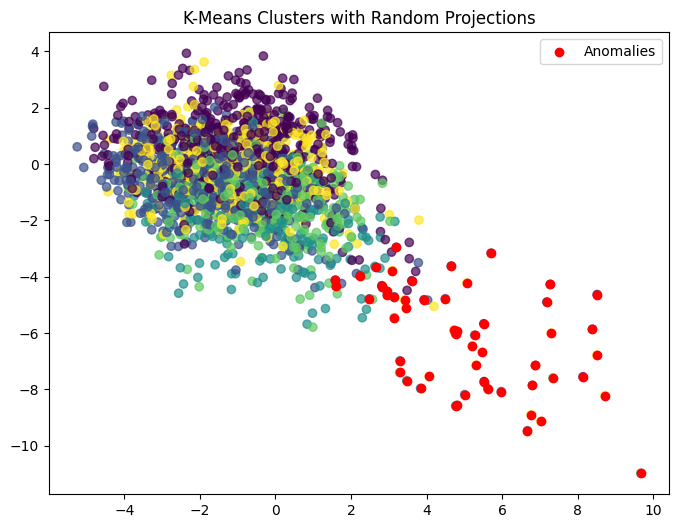

In [117]:
# RP
plt.figure(figsize=(8, 6))
plt.scatter(X_rp[:, 0], X_rp[:, 1], c=kmeans_labels, cmap='viridis', alpha=0.7)
plt.scatter(X_rp[anomalies, 0], X_rp[anomalies, 1], color='red', label='Anomalies')
plt.title('K-Means Clusters with Random Projections')
plt.legend()
plt.show()

In [180]:
# this looks good

#### Z-Score Analysis

In [120]:
from scipy import stats

# Calculate Z-scores for K-Means distances
z_scores = stats.zscore(distances)

# Set threshold for anomalies 
z_score_threshold = 3
z_score_anomalies = np.where(np.abs(z_scores) > z_score_threshold)[0]

# Add Z-score anomaly labels
anomaly_labels = np.zeros(len(X_train))
anomaly_labels[z_score_anomalies] = 1

# Add anomalies to the dataset (for visualization)
X_train_copy = np.hstack((X_train, anomaly_labels.reshape(-1, 1)))

print(f"Total anomalies detected by Z-score analysis: {len(z_score_anomalies)}")

Total anomalies detected by Z-score analysis: 55


### DBSCAN

In [166]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=2.2, min_samples=5)
dbscan_labels = dbscan.fit_predict(X_train)

# Add cluster labels (-1 indicates anomalies)
anomalies = dbscan_labels == -1

# Add anomaly labels to the data
X_train_with_anomalies = np.hstack((X_train, anomalies.reshape(-1, 1)))

In [167]:
# Count anomalies
num_anomalies = np.sum(anomalies)
print(f'Total anomalies detected by DBSCAN: {num_anomalies}')

Total anomalies detected by DBSCAN: 89


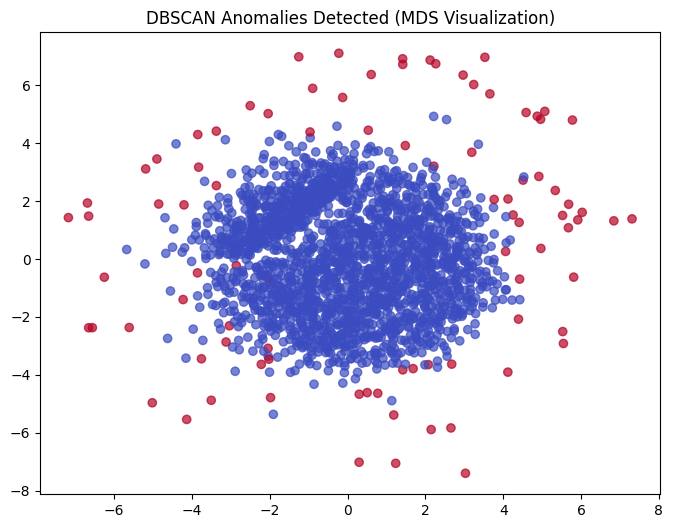

In [168]:
# MDS
plt.figure(figsize=(8, 6))
plt.scatter(X_mds[:, 0], X_mds[:, 1], c=anomalies, cmap='coolwarm', alpha=0.7)
plt.title('DBSCAN Anomalies Detected (MDS Visualization)')
plt.show()

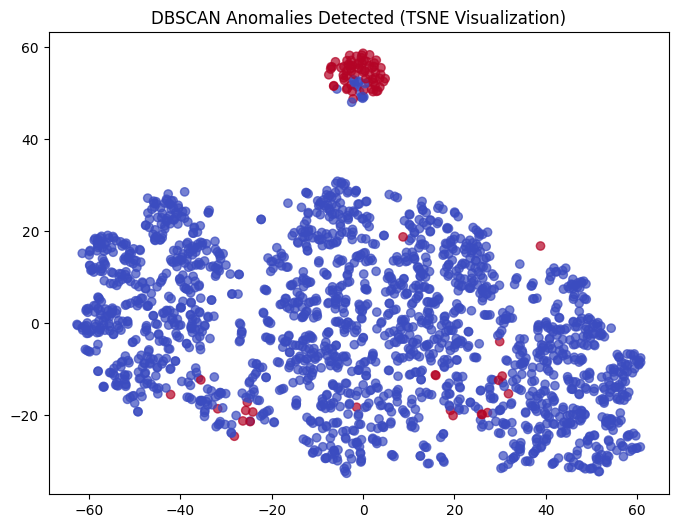

In [169]:
# TSNE
plt.figure(figsize=(8, 6))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=anomalies, cmap='coolwarm', alpha=0.7)
plt.title('DBSCAN Anomalies Detected (TSNE Visualization)')
plt.show()

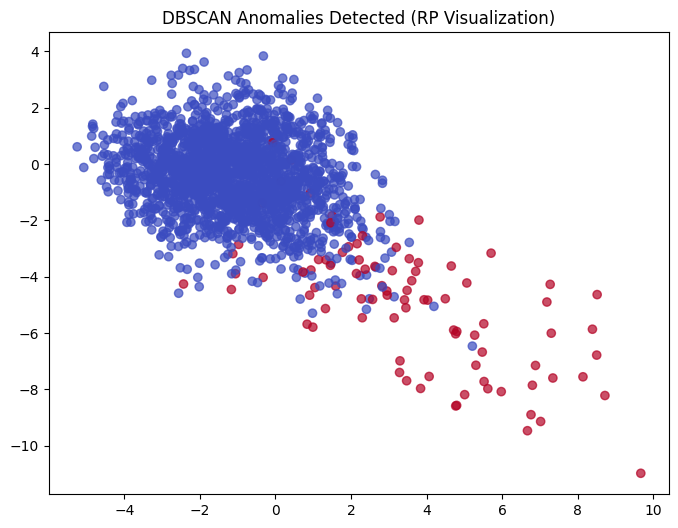

In [170]:
# RP
plt.figure(figsize=(8, 6))
plt.scatter(X_rp[:, 0], X_rp[:, 1], c=anomalies, cmap='coolwarm', alpha=0.7)
plt.title('DBSCAN Anomalies Detected (RP Visualization)')
plt.show()

In [181]:
# this looks good

### Guassian Mixtures

In [182]:
from sklearn.mixture import GaussianMixture

gmm = GaussianMixture(n_components=7, random_state=42)
gmm_labels = gmm.fit_predict(X_train)

# Compute log-likelihood of each sample
log_likelihood = gmm.score_samples(X_train)

# Set anomaly threshold: Mean - 3 * Standard Deviation of log-likelihoods
threshold = np.mean(log_likelihood) - 3 * np.std(log_likelihood)

# Anomalies are points with log-likelihood below the threshold
anomalies = log_likelihood < threshold

# Add anomaly labels to the data
X_train_with_anomalies = np.hstack((X_train, anomalies.reshape(-1, 1)))

In [183]:
# Count anomalies
num_anomalies = np.sum(anomalies)
print(f'Total anomalies detected by GMM: {num_anomalies}')

Total anomalies detected by GMM: 99


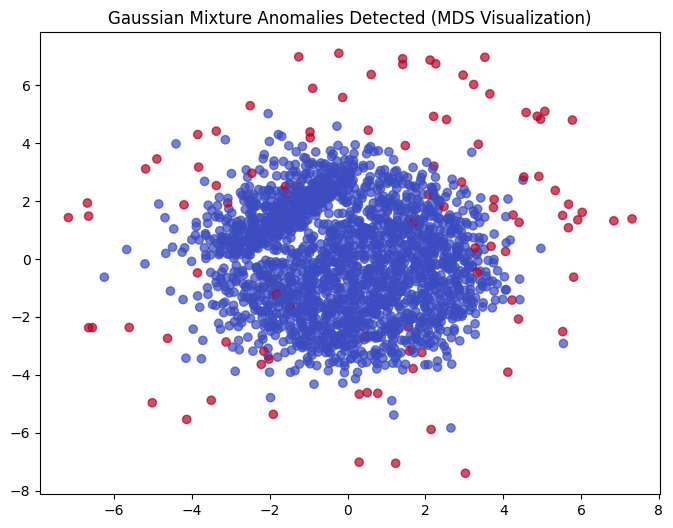

In [184]:
# Plot using MDS
plt.figure(figsize=(8, 6))
plt.scatter(X_mds[:, 0], X_mds[:, 1], c=anomalies, cmap='coolwarm', alpha=0.7)
plt.title('Gaussian Mixture Anomalies Detected (MDS Visualization)')
plt.show()

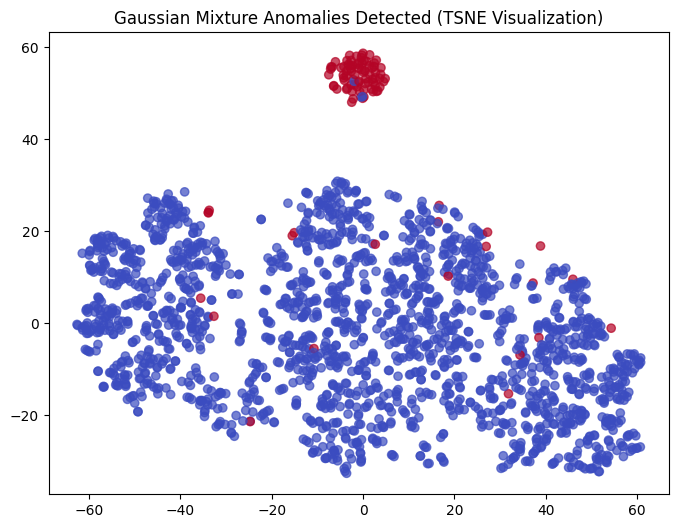

In [186]:
# Plot using TSNE
plt.figure(figsize=(8, 6))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=anomalies, cmap='coolwarm', alpha=0.7)
plt.title('Gaussian Mixture Anomalies Detected (TSNE Visualization)')
plt.show()

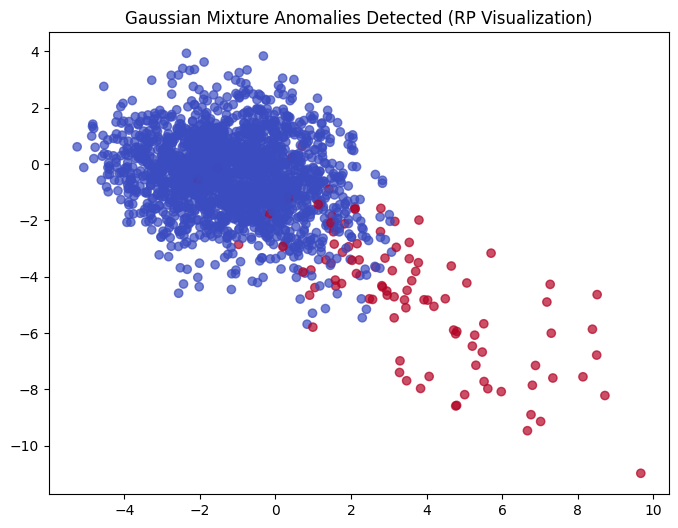

In [187]:
# Plot using RP
plt.figure(figsize=(8, 6))
plt.scatter(X_rp[:, 0], X_rp[:, 1], c=anomalies, cmap='coolwarm', alpha=0.7)
plt.title('Gaussian Mixture Anomalies Detected (RP Visualization)')
plt.show()

In [188]:
# this looks good too

### Bayesian Guassian Mixture

In [197]:
from sklearn.mixture import BayesianGaussianMixture

bgmm = BayesianGaussianMixture(n_components=5, random_state=42, reg_covar=1e-6)
bgmm_labels = bgmm.fit_predict(X_train)

# Compute log-likelihood of each sample
log_likelihood = bgmm.score_samples(X_train)

# Set anomaly threshold: Mean - 3 * Standard Deviation of log-likelihoods
threshold = np.mean(log_likelihood) - 3 * np.std(log_likelihood)

# Identify anomalies
anomalies = log_likelihood < threshold

# Add anomaly labels to X_train
X_train_with_anomalies = np.hstack((X_train, anomalies.reshape(-1, 1)))

In [198]:
bgmm.weights_

array([0.5049728 , 0.22961907, 0.00198433, 0.25054599, 0.01287781])

In [199]:
# Count anomalies
num_anomalies = np.sum(anomalies)
print(f'Total anomalies detected by BGMM: {num_anomalies}')

Total anomalies detected by BGMM: 30


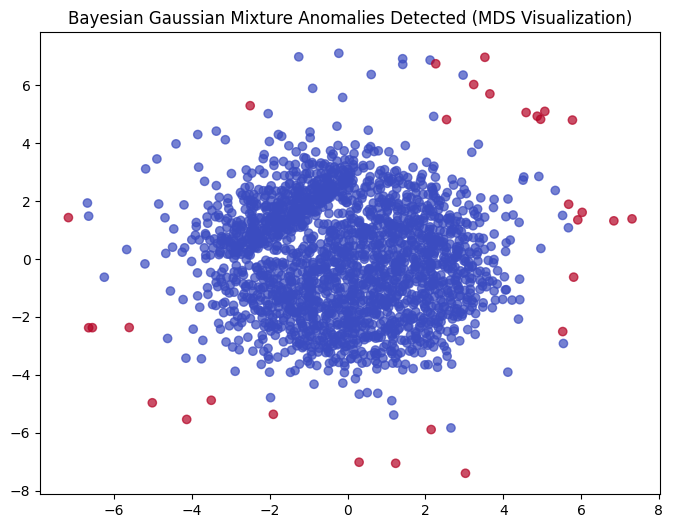

In [200]:
# MDS
plt.figure(figsize=(8, 6))
plt.scatter(X_mds[:, 0], X_mds[:, 1], c=anomalies, cmap='coolwarm', alpha=0.7)
plt.title('Bayesian Gaussian Mixture Anomalies Detected (MDS Visualization)')
plt.show()

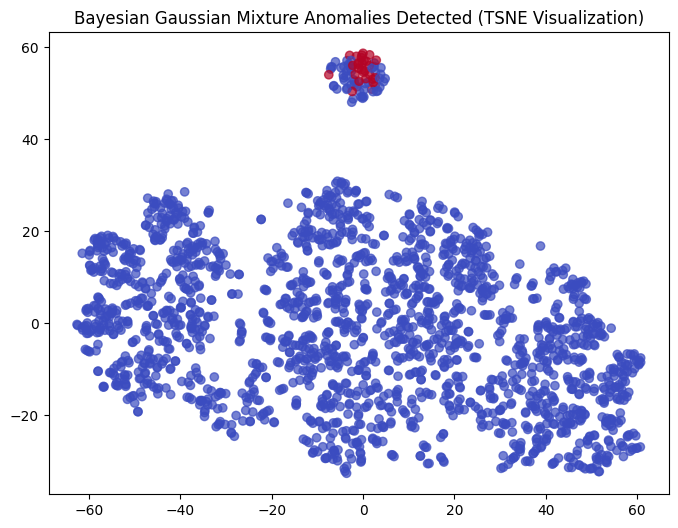

In [201]:
# TSNE
# MDS
plt.figure(figsize=(8, 6))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=anomalies, cmap='coolwarm', alpha=0.7)
plt.title('Bayesian Gaussian Mixture Anomalies Detected (TSNE Visualization)')
plt.show()

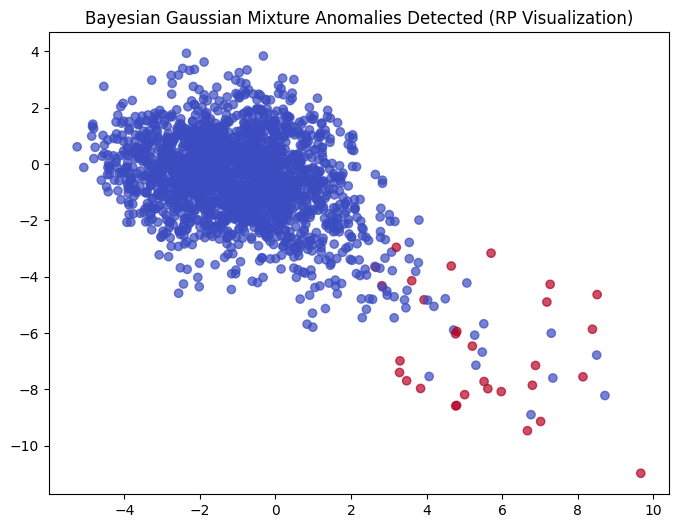

In [202]:
# RP
plt.figure(figsize=(8, 6))
plt.scatter(X_rp[:, 0], X_rp[:, 1], c=anomalies, cmap='coolwarm', alpha=0.7)
plt.title('Bayesian Gaussian Mixture Anomalies Detected (RP Visualization)')
plt.show()

In [213]:
# this is good

### Isolation Forest

In [205]:
from sklearn.ensemble import IsolationForest

iso_forest = IsolationForest(n_estimators=100, contamination=0.05, random_state=42)
iso_forest_labels = iso_forest.fit_predict(X_train)

# Anomalies are labeled as -1 by Isolation Forest
iso_anomalies = iso_forest_labels == -1

# Add anomaly labels to X_train
X_train_with_iso_anomalies = np.hstack((X_train, iso_anomalies.reshape(-1, 1)))

# Count anomalies
num_iso_anomalies = np.sum(iso_anomalies)
print(f'Total anomalies detected by Isolation Forest: {num_iso_anomalies}')

Total anomalies detected by Isolation Forest: 101


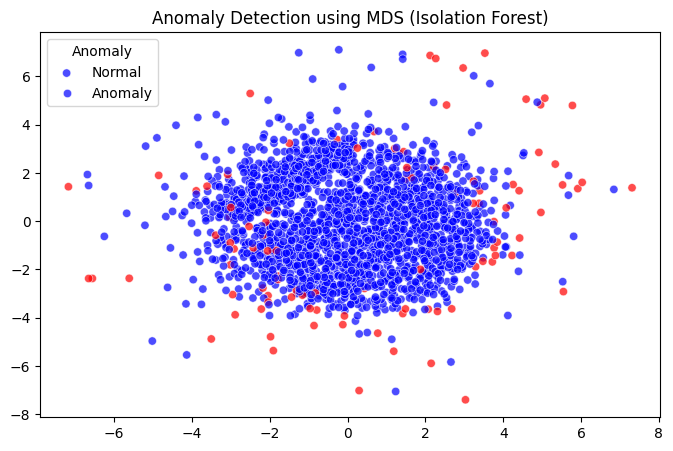

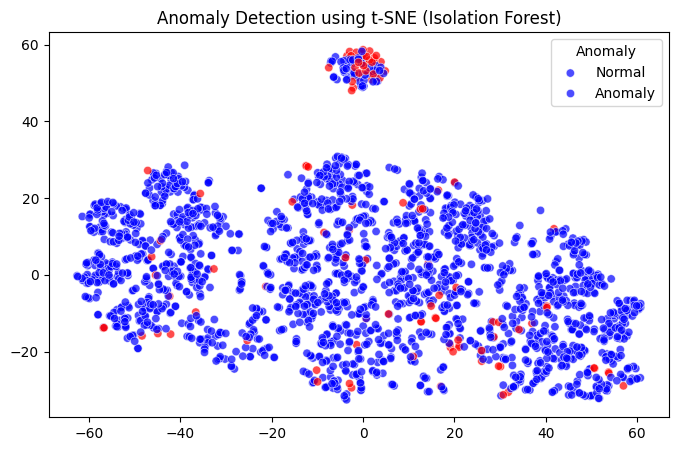

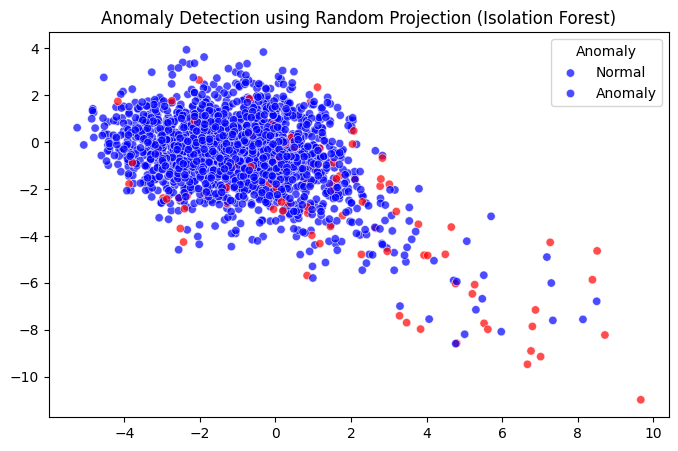

In [207]:
def plot_anomalies(method_name, transformed_data, anomalies, colors=('blue', 'red')):
    plt.figure(figsize=(8, 5))
    sns.scatterplot(
        x=transformed_data[:, 0], y=transformed_data[:, 1],
        hue=anomalies, palette={True: colors[1], False: colors[0]},
        alpha=0.7
    )
    plt.title(f'Anomaly Detection using {method_name}')
    plt.legend(title='Anomaly', labels=['Normal', 'Anomaly'])
    plt.show()

# Plot Isolation Forest anomalies
plot_anomalies('MDS (Isolation Forest)', X_mds, iso_anomalies)
plot_anomalies('t-SNE (Isolation Forest)', X_tsne, iso_anomalies)
plot_anomalies('Random Projection (Isolation Forest)', X_rp, iso_anomalies)

In [211]:
# this looks good

### LOF

In [208]:
from sklearn.neighbors import LocalOutlierFactor

lof = LocalOutlierFactor(n_neighbors=20, contamination=0.05)
lof_labels = lof.fit_predict(X_train)

# Anomalies are labeled as -1 by LOF
lof_anomalies = lof_labels == -1

# Add anomaly labels to X_train
X_train_with_lof_anomalies = np.hstack((X_train, lof_anomalies.reshape(-1, 1)))

# Count anomalies
num_lof_anomalies = np.sum(lof_anomalies)
print(f'Total anomalies detected by Local Outlier Factor: {num_lof_anomalies}')

Total anomalies detected by Local Outlier Factor: 101


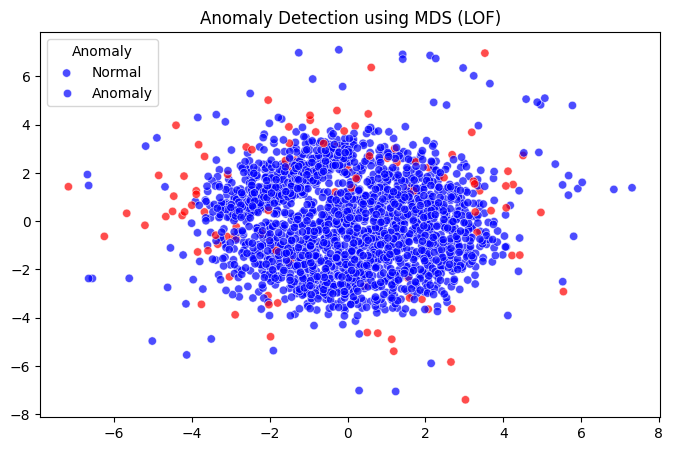

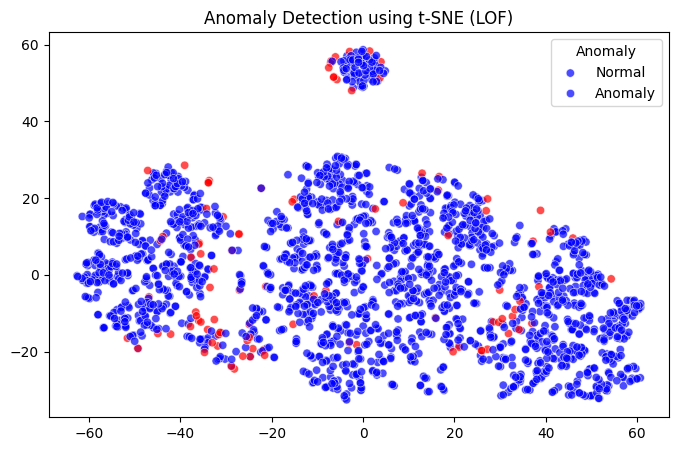

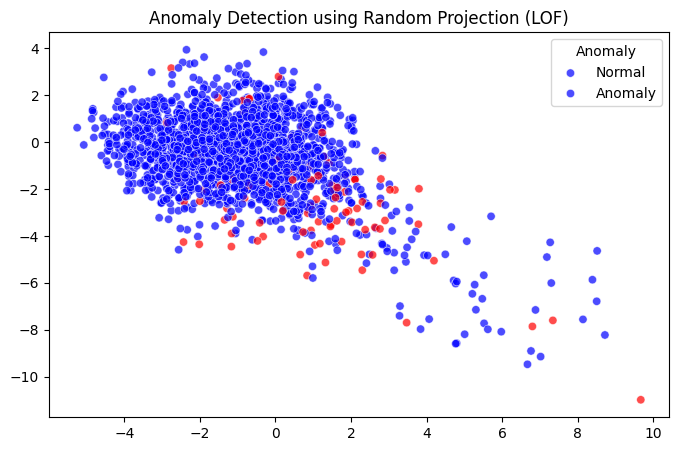

In [210]:
# Plot LOF anomalies
plot_anomalies('MDS (LOF)', X_mds, lof_anomalies)
plot_anomalies('t-SNE (LOF)', X_tsne, lof_anomalies)
plot_anomalies('Random Projection (LOF)', X_rp, lof_anomalies)

In [212]:
# this isn't so good